# Advanced Linear Regression

## Problem statement

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

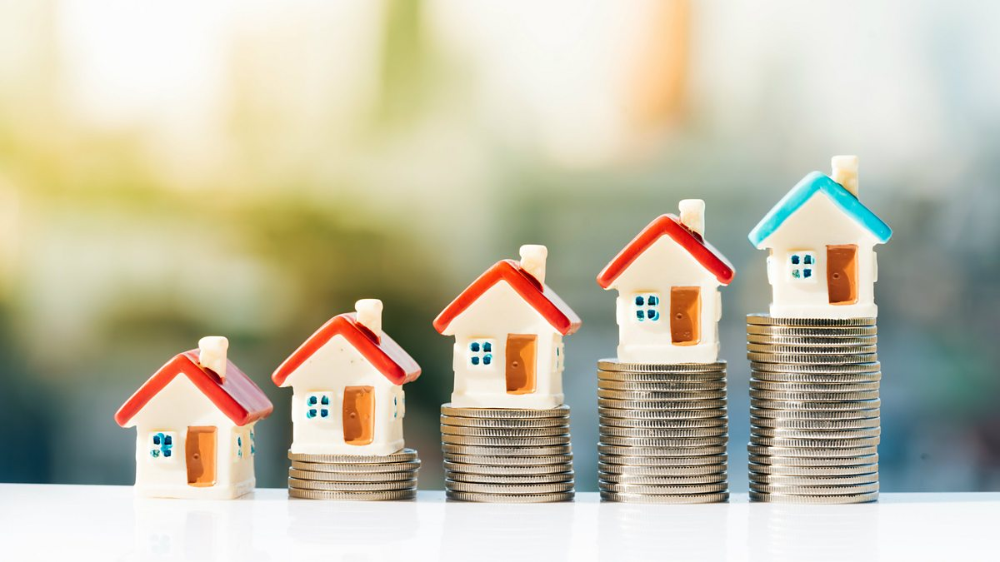

## Importing Libraries

In [1]:
from matplotlib.dates import TU
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression,Ridge, Lasso
import statsmodels.api as sm
from sklearn.metrics import r2_score,mean_squared_error

In [2]:
df=pd.read_csv('train.csv')
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [5]:
for col in df.columns:
    print(col,": ",df[col].isnull().sum())

Id :  0
MSSubClass :  0
MSZoning :  0
LotFrontage :  259
LotArea :  0
Street :  0
Alley :  1369
LotShape :  0
LandContour :  0
Utilities :  0
LotConfig :  0
LandSlope :  0
Neighborhood :  0
Condition1 :  0
Condition2 :  0
BldgType :  0
HouseStyle :  0
OverallQual :  0
OverallCond :  0
YearBuilt :  0
YearRemodAdd :  0
RoofStyle :  0
RoofMatl :  0
Exterior1st :  0
Exterior2nd :  0
MasVnrType :  8
MasVnrArea :  8
ExterQual :  0
ExterCond :  0
Foundation :  0
BsmtQual :  37
BsmtCond :  37
BsmtExposure :  38
BsmtFinType1 :  37
BsmtFinSF1 :  0
BsmtFinType2 :  38
BsmtFinSF2 :  0
BsmtUnfSF :  0
TotalBsmtSF :  0
Heating :  0
HeatingQC :  0
CentralAir :  0
Electrical :  1
1stFlrSF :  0
2ndFlrSF :  0
LowQualFinSF :  0
GrLivArea :  0
BsmtFullBath :  0
BsmtHalfBath :  0
FullBath :  0
HalfBath :  0
BedroomAbvGr :  0
KitchenAbvGr :  0
KitchenQual :  0
TotRmsAbvGrd :  0
Functional :  0
Fireplaces :  0
FireplaceQu :  690
GarageType :  81
GarageYrBlt :  81
GarageFinish :  81
GarageCars :  0
GarageArea :

### Handing missing data

In [6]:
df=df.drop(['Alley','LotFrontage','MasVnrType','FireplaceQu','PoolQC','Fence','MiscFeature'],axis=1)

df.head()

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
1,2,20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
2,3,60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
3,4,70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
4,5,60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000


In [7]:
df=df.dropna()

In [8]:
for col in df.columns:
    print(col,": ",df[col].isnull().sum())

Id :  0
MSSubClass :  0
MSZoning :  0
LotArea :  0
Street :  0
LotShape :  0
LandContour :  0
Utilities :  0
LotConfig :  0
LandSlope :  0
Neighborhood :  0
Condition1 :  0
Condition2 :  0
BldgType :  0
HouseStyle :  0
OverallQual :  0
OverallCond :  0
YearBuilt :  0
YearRemodAdd :  0
RoofStyle :  0
RoofMatl :  0
Exterior1st :  0
Exterior2nd :  0
MasVnrArea :  0
ExterQual :  0
ExterCond :  0
Foundation :  0
BsmtQual :  0
BsmtCond :  0
BsmtExposure :  0
BsmtFinType1 :  0
BsmtFinSF1 :  0
BsmtFinType2 :  0
BsmtFinSF2 :  0
BsmtUnfSF :  0
TotalBsmtSF :  0
Heating :  0
HeatingQC :  0
CentralAir :  0
Electrical :  0
1stFlrSF :  0
2ndFlrSF :  0
LowQualFinSF :  0
GrLivArea :  0
BsmtFullBath :  0
BsmtHalfBath :  0
FullBath :  0
HalfBath :  0
BedroomAbvGr :  0
KitchenAbvGr :  0
KitchenQual :  0
TotRmsAbvGrd :  0
Functional :  0
Fireplaces :  0
GarageType :  0
GarageYrBlt :  0
GarageFinish :  0
GarageCars :  0
GarageArea :  0
GarageQual :  0
GarageCond :  0
PavedDrive :  0
WoodDeckSF :  0
OpenPorc

## EDA

In [9]:
#List of numerical values
numerical_features=[feature for feature in df.columns if df[feature].dtypes!='O']
print('number of numerical_features:',len(numerical_features))
print("the numerical features:",numerical_features)

number of numerical_features: 37
the numerical features: ['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


In [10]:
discrete_feature=[feature for feature in numerical_features if len(df[feature].unique())<25]
print("number of discrete Variables Count: ",len(discrete_feature))
print("the discrete features:",discrete_feature)

number of discrete Variables Count:  18
the discrete features: ['MSSubClass', 'OverallQual', 'OverallCond', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


In [11]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("Continuous feature Count: ",len(continuous_feature))
print("the Continuous features:",continuous_feature)

Continuous feature Count:  19
the Continuous features: ['Id', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'SalePrice']


In [12]:
categorical_features=[feature for feature in df.columns if df[feature].dtypes=='O']
print('number of categorical_features:',len(categorical_features))
print("the categorical features:",categorical_features)

number of categorical_features: 37
the categorical features: ['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [13]:
binary_feature=[feature for feature in categorical_features if len(df[feature].unique())<3]
print("number of binary Variables Count: ",len(binary_feature))
print("the binary features:",binary_feature)

number of binary Variables Count:  3
the binary features: ['Street', 'Utilities', 'CentralAir']


In [14]:
multi_ctg_feature=[feature for feature in categorical_features if feature not in binary_feature]
print("multi_ctg feature Count: ",len(multi_ctg_feature))
print("the multi_ctg features:",multi_ctg_feature)

multi_ctg feature Count:  34
the multi_ctg features: ['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


### Univariate Ananlysis

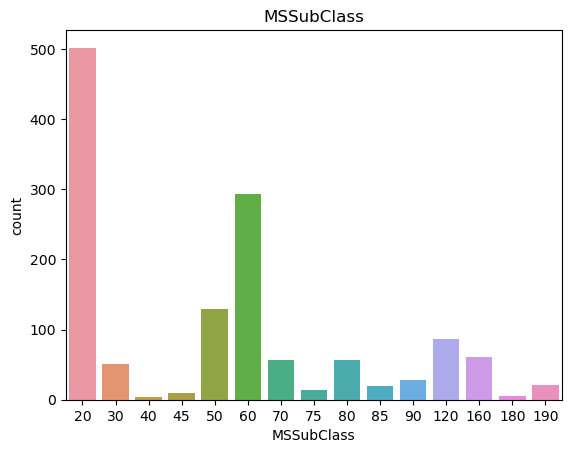

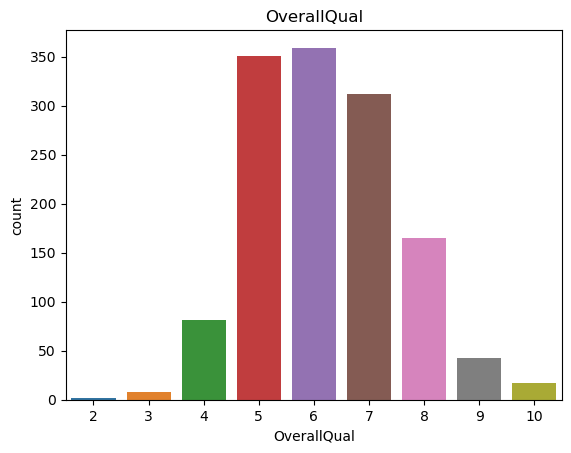

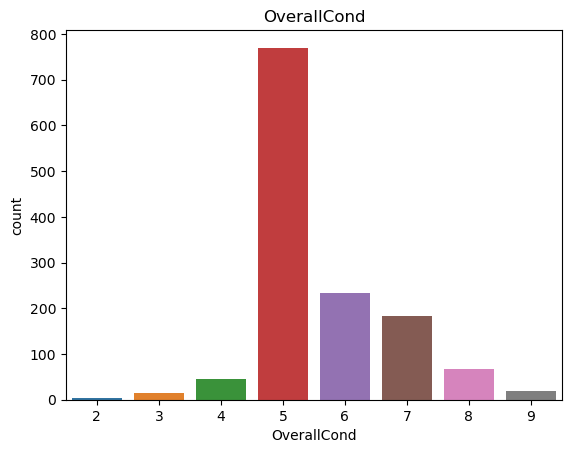

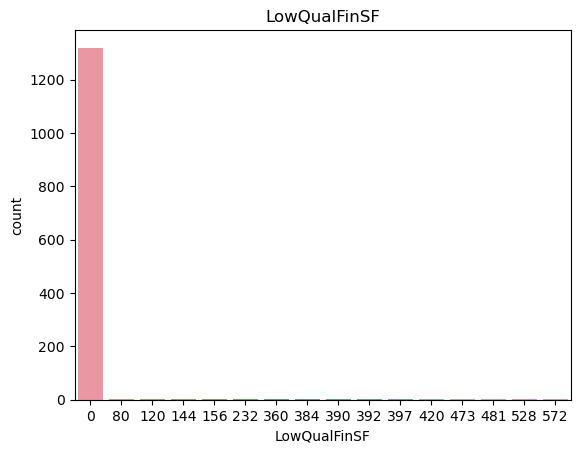

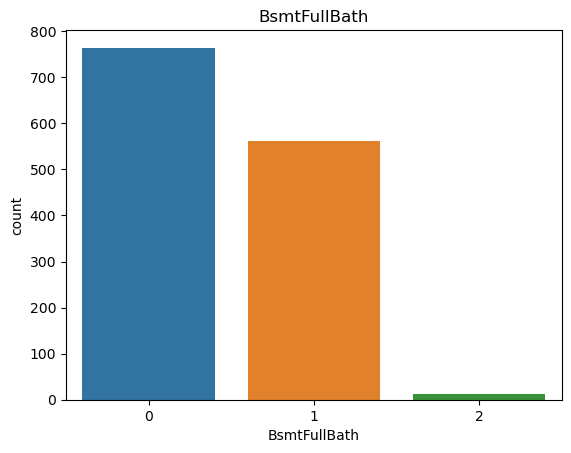

...

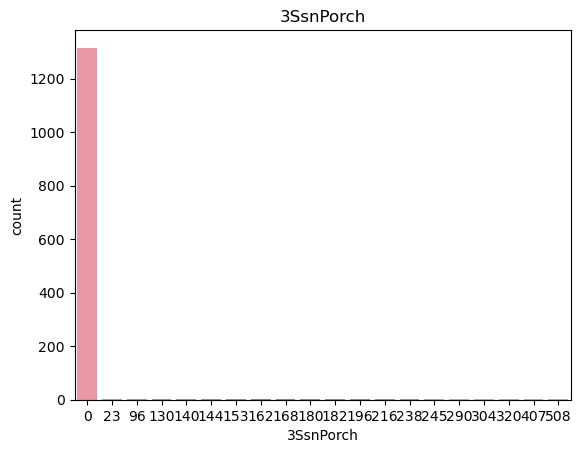

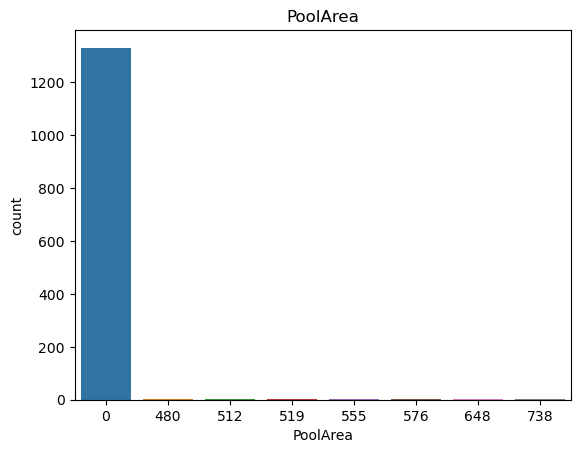

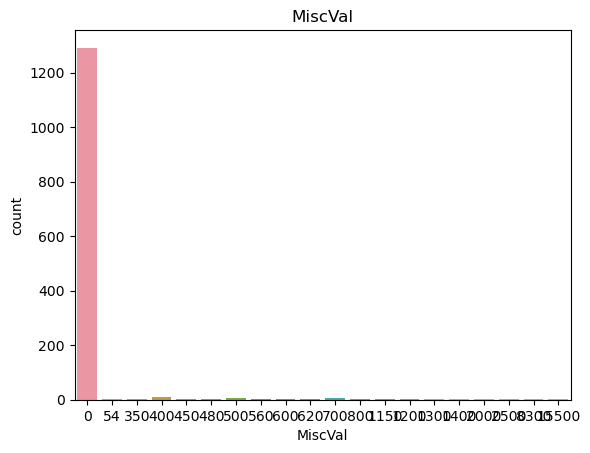

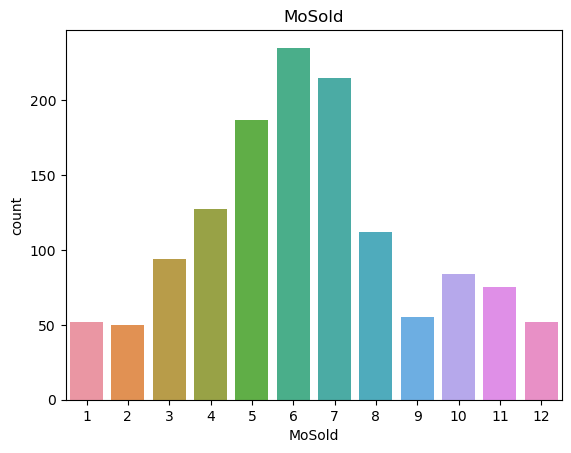

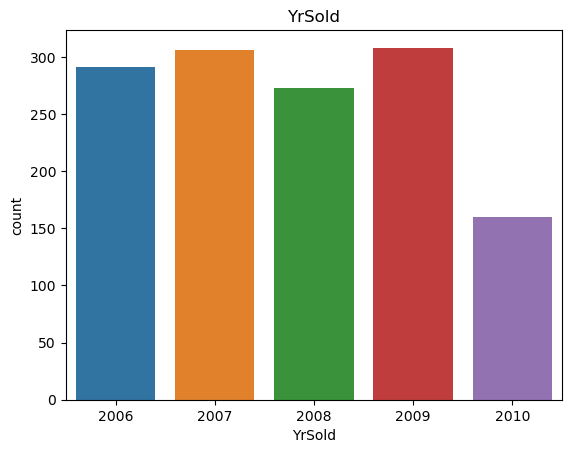

In [15]:
for feature in discrete_feature:
    # data=df.copy()
    sns.countplot(data=df,x=df[feature])
    plt.xlabel(feature)
    plt.ylabel('count')
    plt.title(feature)
    plt.show()

#### Key Takeaways:
We can observe the above graphs shows the count plots of all the discrete feature. 

In [16]:
###continuous feature
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("Continuous feature Count: ",len(continuous_feature))
print("the Continuous features:",continuous_feature)

Continuous feature Count:  19
the Continuous features: ['Id', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'SalePrice']


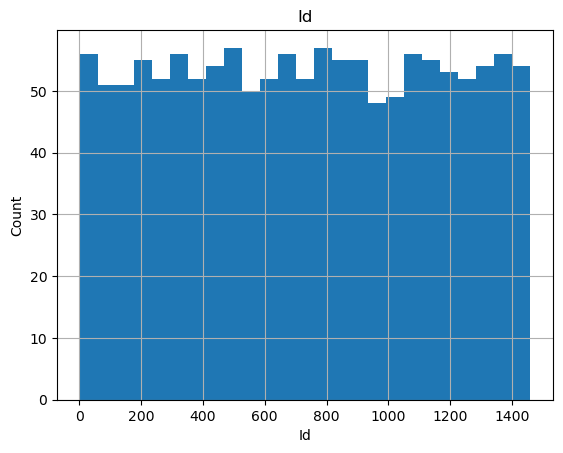

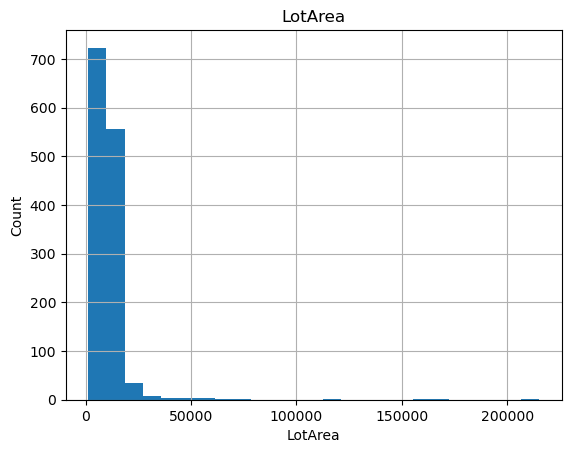

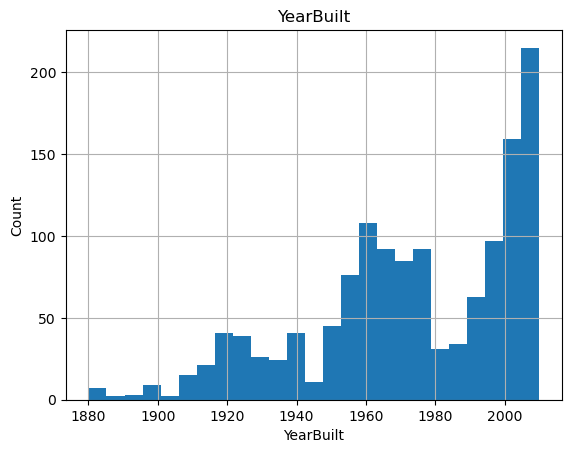

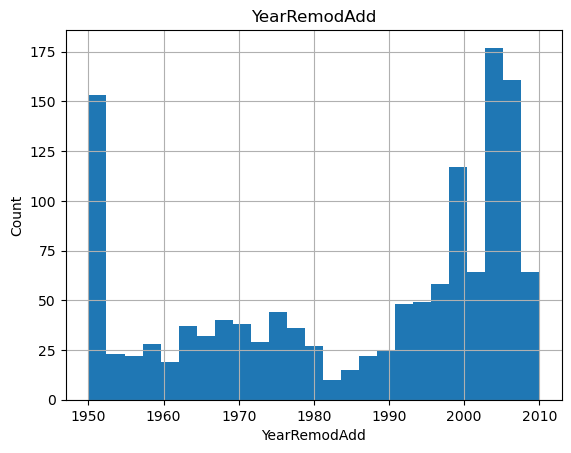

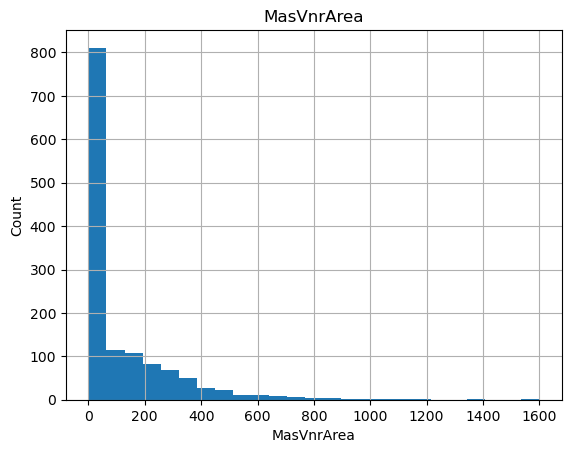

...

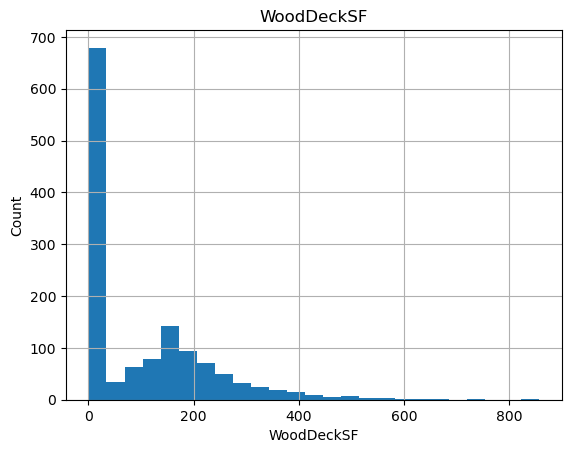

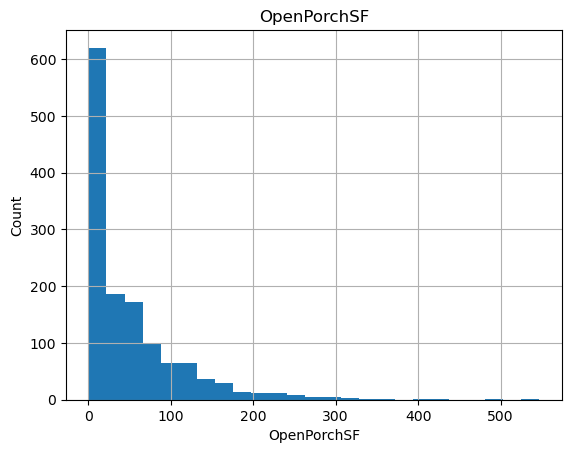

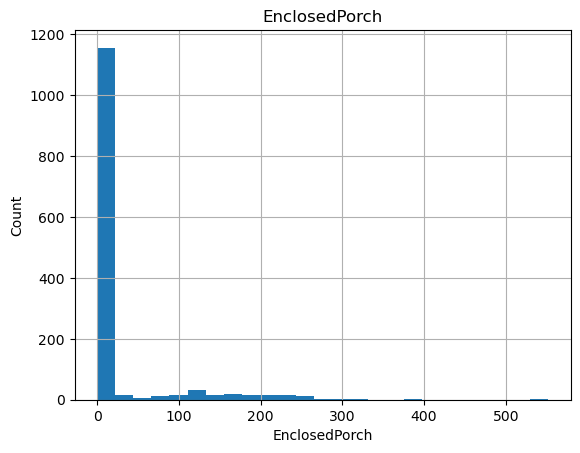

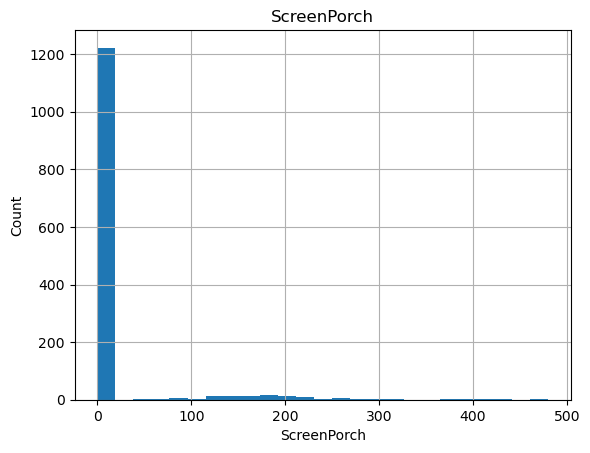

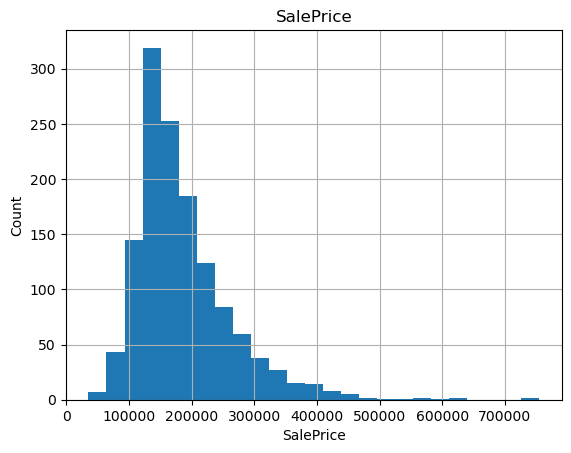

In [17]:
for feature in continuous_feature:
    data=df.copy()
    data[feature].hist(bins=25)
    #plt.figure(figsize=(10,5))
    # sns.histplot(data[feature])
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

#### Key Takeaways:
We can observe the above graphs shows the histogram plots of all the continuous feature with the data distribution. 

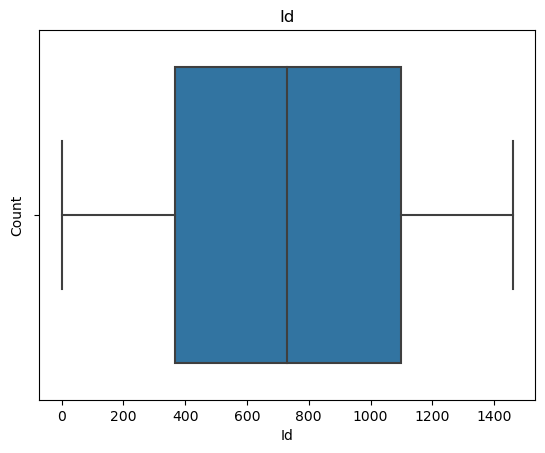

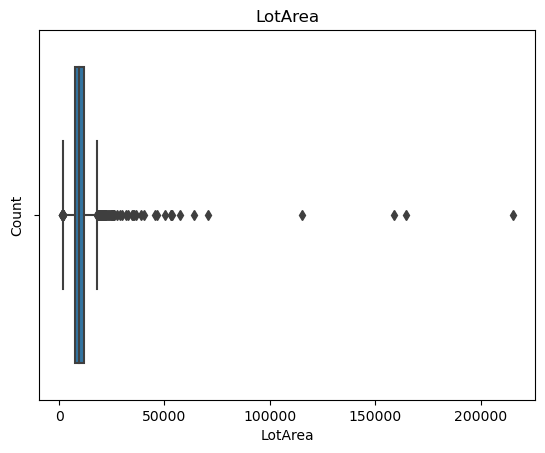

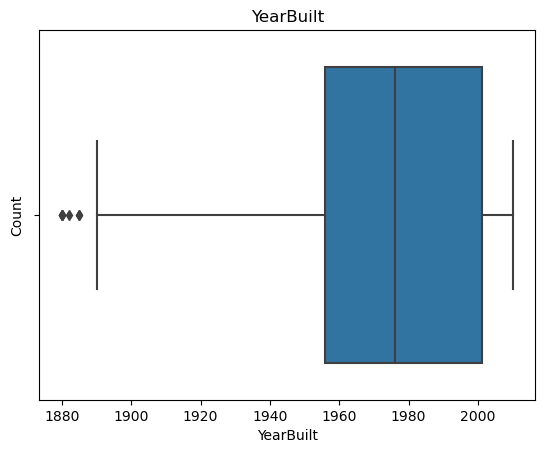

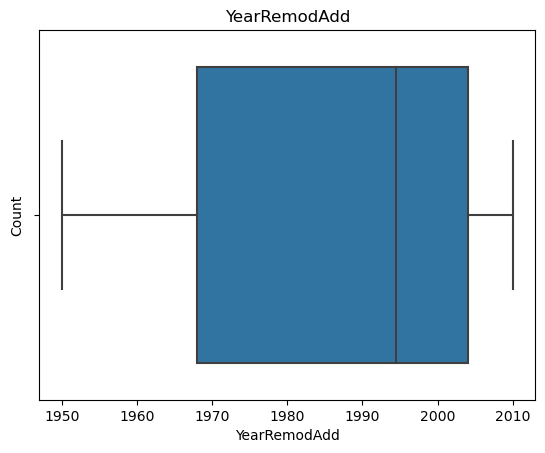

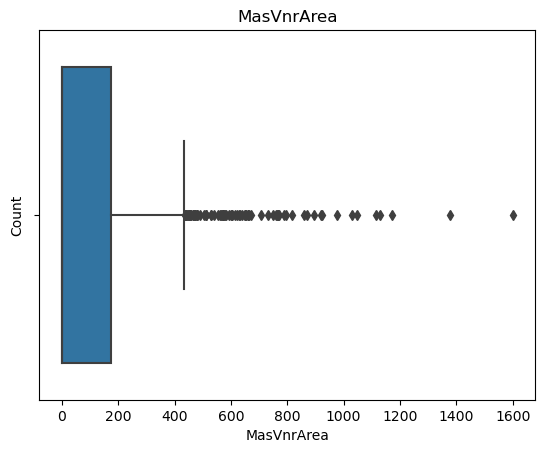

...

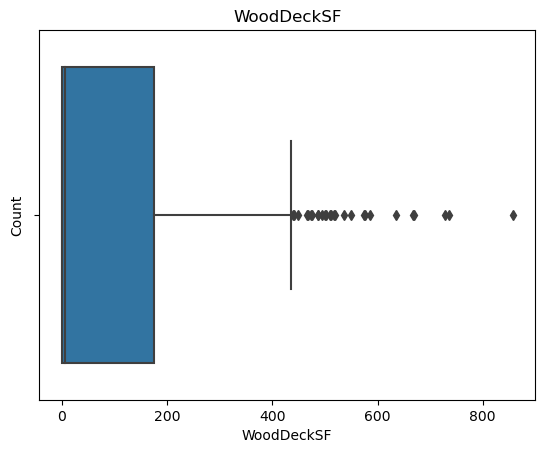

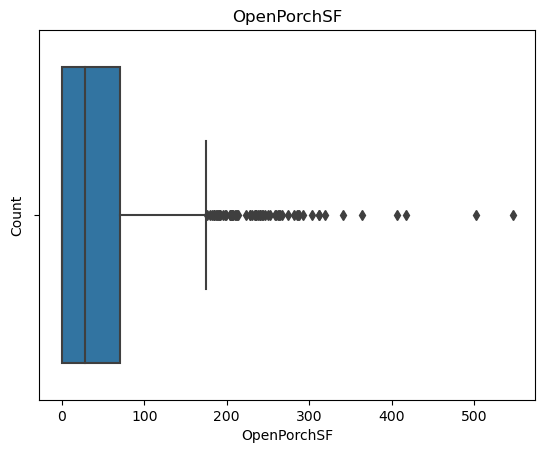

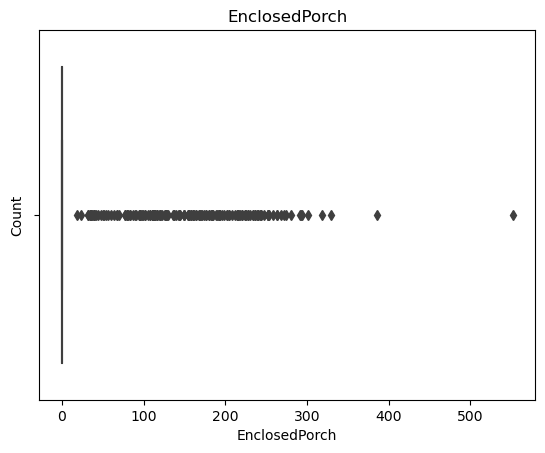

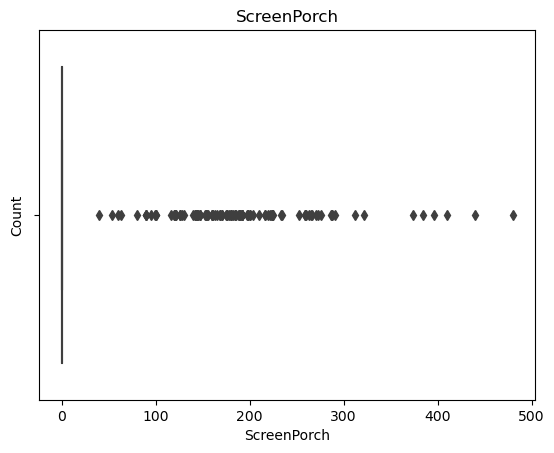

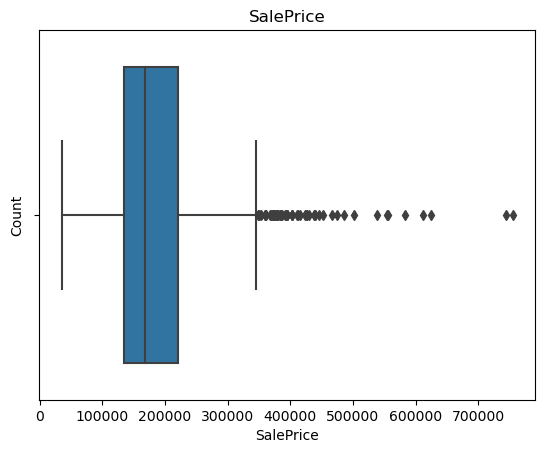

In [18]:
for feature in continuous_feature:
#     data=df.copy()
    sns.boxplot(data=df,x=data[feature])
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

#### Key Takeaways:
We can observe the above graphs shows the box plots of all the continuou features. 

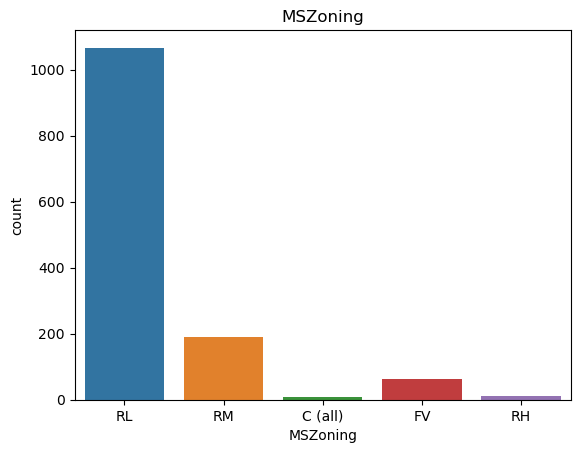

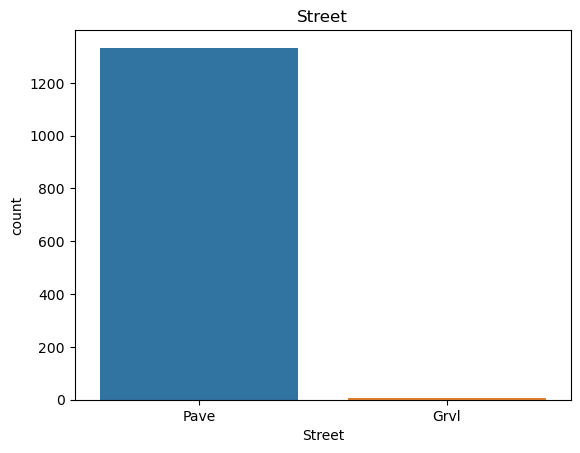

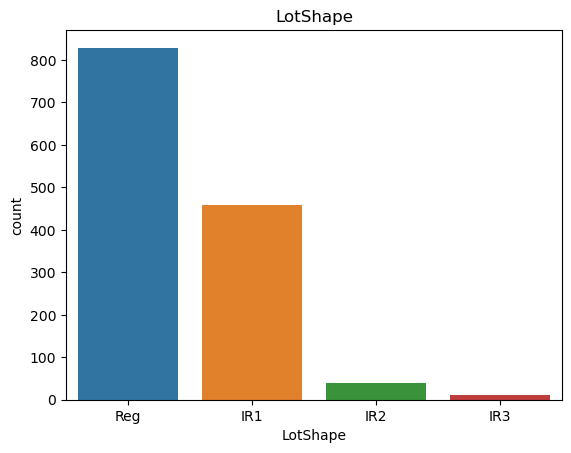

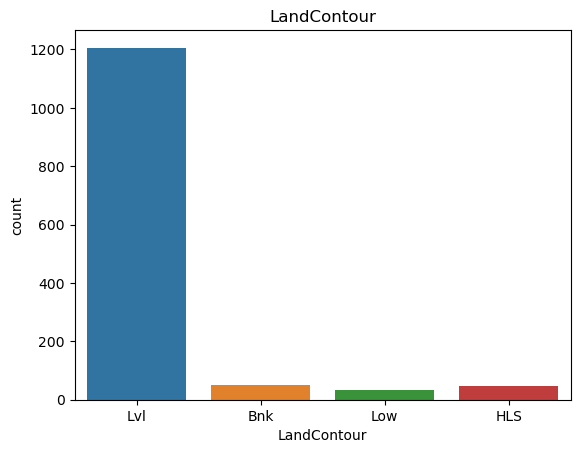

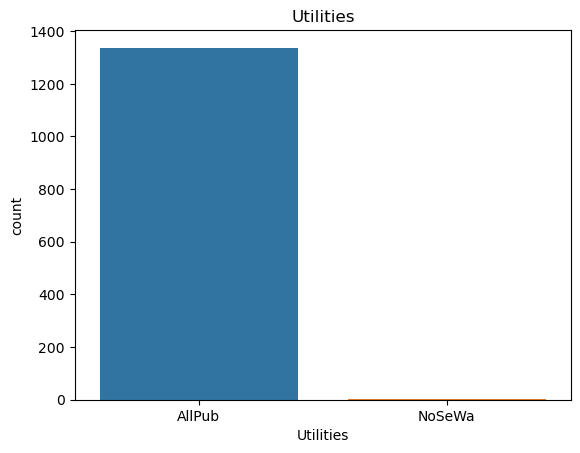

...

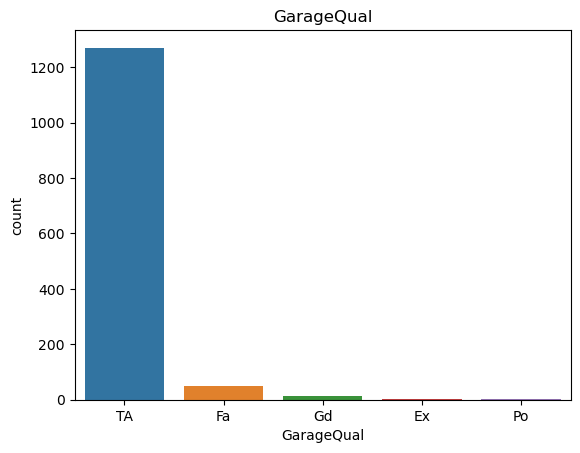

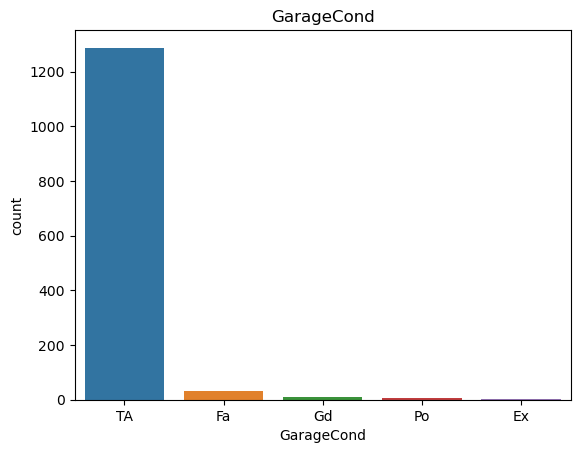

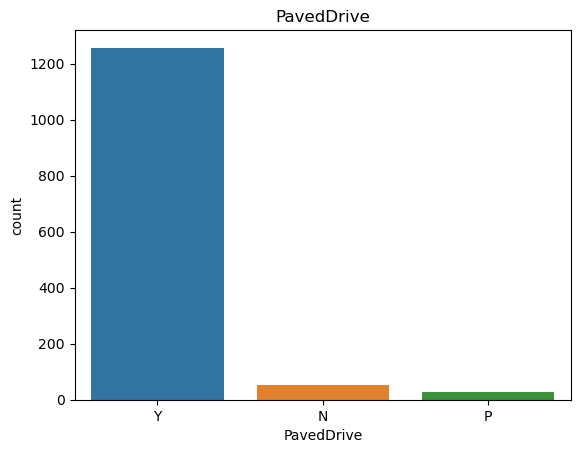

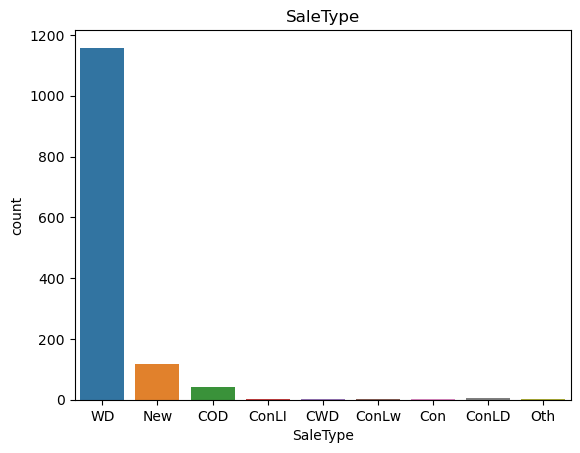

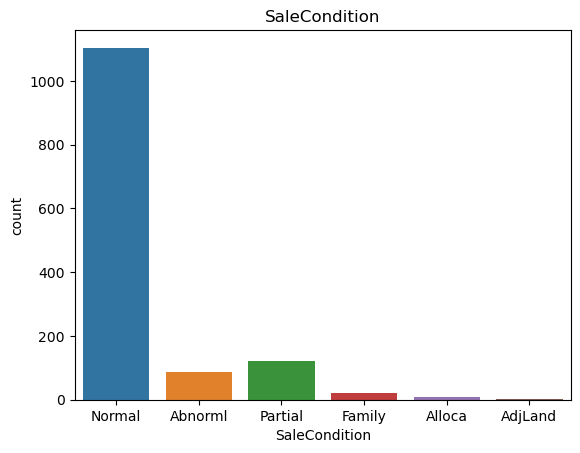

In [19]:
for feature in categorical_features:
    # data=df.copy()
    sns.countplot(data=df,x=df[feature])
    plt.xlabel(feature)
    plt.ylabel('count')
    plt.title(feature)
    plt.show()

#### Key Takeaways:
We can observe the above graphs shows the count plots of all the categorical feature. 

### Bivariate Ananlysis

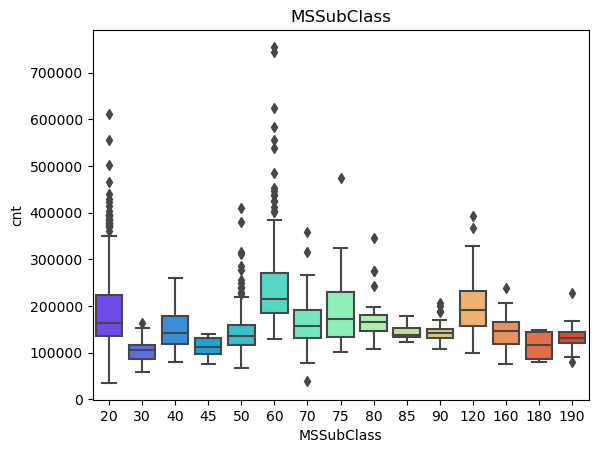

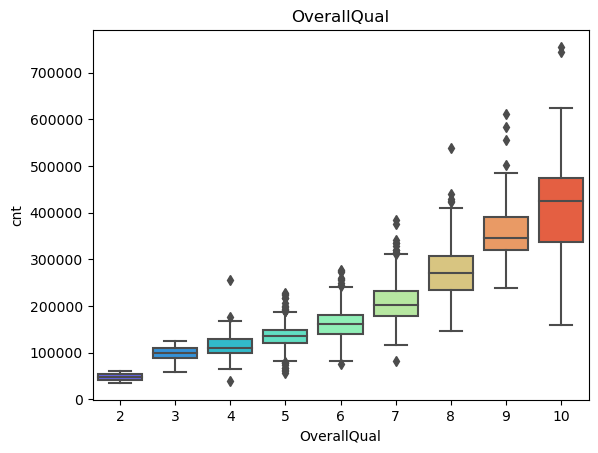

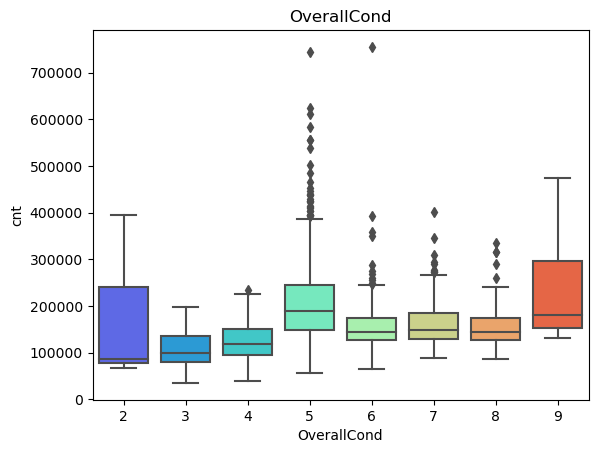

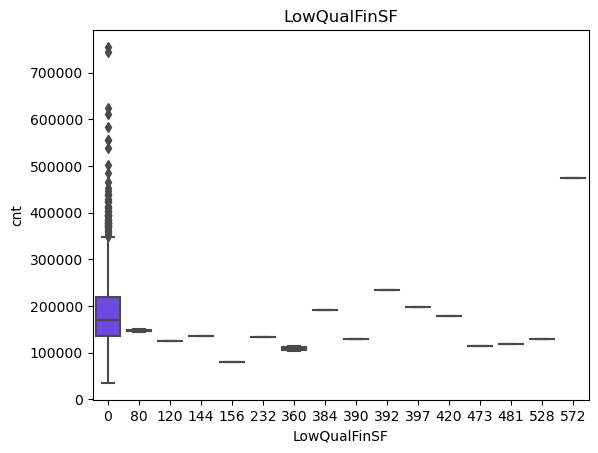

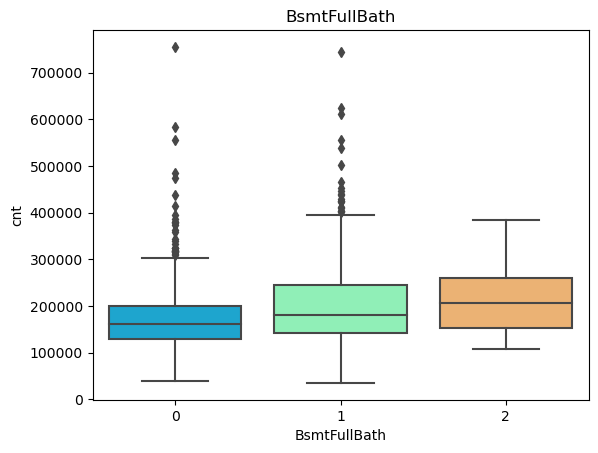

...

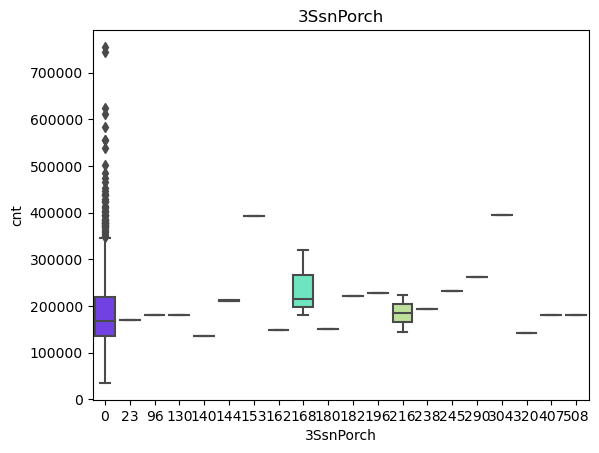

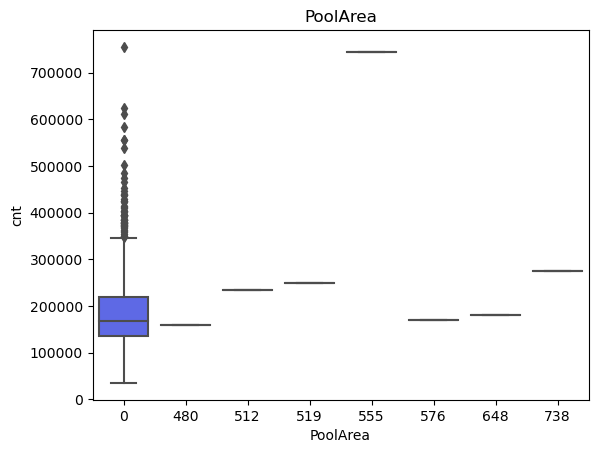

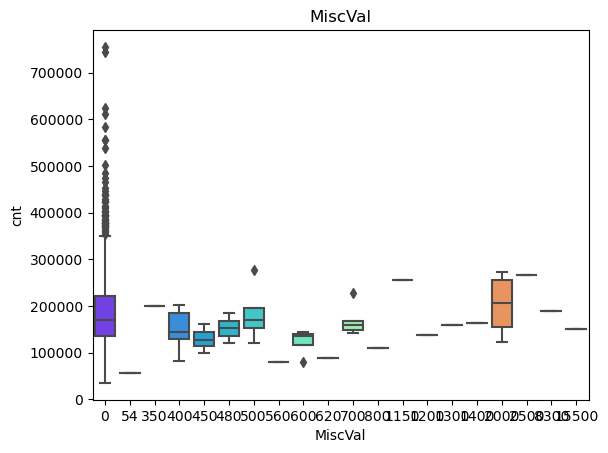

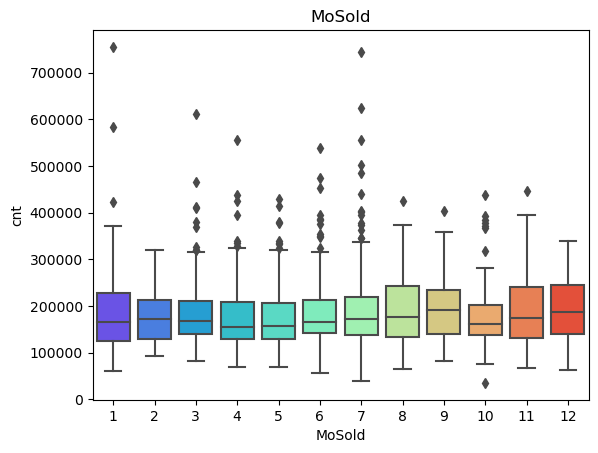

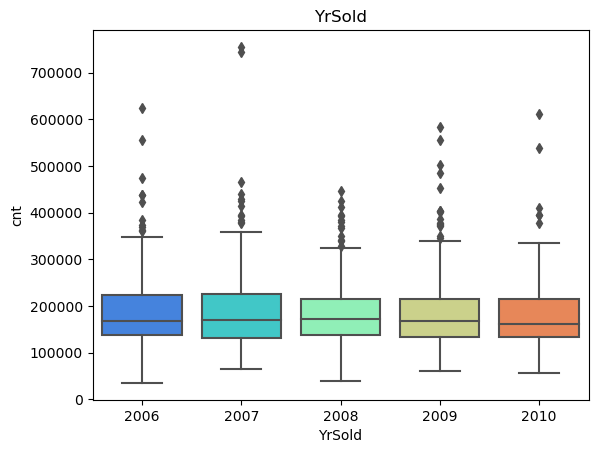

In [20]:
for feature in discrete_feature:
    # data=df.copy()
    sns.boxplot(data=df,x=df[feature], y = "SalePrice",palette = "rainbow")
    plt.xlabel(feature)
    plt.ylabel('cnt')
    plt.title(feature)
    plt.show()

#### Key Takeaways:
We can observe the above graphs shows the box plots of all the discrete features with respect to cnt. 

## Data Cleaning

In [21]:
print("Street unique: ",df['Street'].unique())
print("Utilities unique: ",df['Utilities'].unique())
print("CentralAir unique: ",df['CentralAir'].unique())

Street unique:  ['Pave' 'Grvl']
Utilities unique:  ['AllPub' 'NoSeWa']
CentralAir unique:  ['Y' 'N']


In [22]:
df['Street'] = df['Street'].replace({'Pave': 0, 'Grvl': 1})
df['Utilities'] = df['Utilities'].replace({'AllPub': 0, 'NoSeWa': 1})
df['CentralAir'] = df['CentralAir'].replace({'N': 0, 'Y': 1})


In [23]:
df = pd.get_dummies(df, columns=multi_ctg_feature,dtype=int,drop_first=True)

In [24]:
numerical_features=[feature for feature in df.columns if df[feature].dtypes!='O']
print('number of numerical_features:',len(numerical_features))

number of numerical_features: 225


In [25]:
print("the numerical features:",numerical_features)

the numerical features: ['Id', 'MSSubClass', 'LotArea', 'Street', 'Utilities', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'CentralAir', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside', 'LandSlope_Mod', 'LandSlope_Sev', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edw

In [26]:
for col in df.columns:
    print(f"Correlation between SalePrice & {col} ",df['SalePrice'].corr(df[col]))

Correlation between SalePrice & Id  -0.03047303628015019
Correlation between SalePrice & MSSubClass  -0.07959851790075402
Correlation between SalePrice & LotArea  0.25475735021396995
Correlation between SalePrice & Street  -0.04210601606656361
Correlation between SalePrice & Utilities  -0.017078650564686496
Correlation between SalePrice & OverallQual  0.7835456113843187
Correlation between SalePrice & OverallCond  -0.10862709726954452
Correlation between SalePrice & YearBuilt  0.5042971750930906
Correlation between SalePrice & YearRemodAdd  0.5014353821077963
Correlation between SalePrice & MasVnrArea  0.4658114336002502
Correlation between SalePrice & BsmtFinSF1  0.35967663312618153
Correlation between SalePrice & BsmtFinSF2  -0.031225787844299364
Correlation between SalePrice & BsmtUnfSF  0.19168887890202105
Correlation between SalePrice & TotalBsmtSF  0.6020422814414286
Correlation between SalePrice & CentralAir  0.1997593546980634
Correlation between SalePrice & 1stFlrSF  0.6047144

Correlation between SalePrice & PavedDrive_Y  0.1816916152499582
Correlation between SalePrice & SaleType_CWD  0.016547599172358325
Correlation between SalePrice & SaleType_Con  0.04063045145207293
Correlation between SalePrice & SaleType_ConLD  -0.03331527040825441
Correlation between SalePrice & SaleType_ConLI  0.02427883519572352
Correlation between SalePrice & SaleType_ConLw  -0.015366526634529538
Correlation between SalePrice & SaleType_New  0.3550275477400728
Correlation between SalePrice & SaleType_Oth  -0.024515187286214102
Correlation between SalePrice & SaleType_WD  -0.24470190628895408
Correlation between SalePrice & SaleCondition_AdjLand  -0.021065604984153483
Correlation between SalePrice & SaleCondition_Alloca  -0.0077751892414407164
Correlation between SalePrice & SaleCondition_Family  -0.05803138876812014
Correlation between SalePrice & SaleCondition_Normal  -0.17183290026998738
Correlation between SalePrice & SaleCondition_Partial  0.34876623839706644


#### Key Takeaways:
From the above correlation we can obsereve  the correlation between columns has few positive and few negative correlation with the target column.

### Train Test Split

In [27]:
df_train,df_test=train_test_split(df, test_size=0.2,random_state=200)

### Scaling

In [28]:
scale=MinMaxScaler()
df_train[numerical_features]=scale.fit_transform(df_train[numerical_features])
df_test[numerical_features]=scale.transform(df_test[numerical_features])
df_train.head()

,Id,MSSubClass,LotArea,Street,Utilities,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
248,0.169979,0.235294,0.046031,0.0,0.0,0.625,0.428571,0.946154,0.883333,0.063125,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
459,0.314599,0.176471,0.025907,0.0,0.0,0.375,0.285714,0.538462,0.000000,0.100625,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
926,0.634681,0.235294,0.049222,0.0,0.0,0.750,0.428571,0.946154,0.900000,0.212500,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
317,0.217272,0.235294,0.035192,0.0,0.0,0.750,0.428571,0.969231,0.933333,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
164,0.112406,0.117647,0.018352,0.0,0.0,0.500,0.714286,0.353846,0.900000,0.000000,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [29]:
y_train=df_train.pop('SalePrice')
x_train=df_train
print('x_train shape: ',x_train.shape)
print('y_train shape: ',y_train.shape)

x_train shape:  (1070, 224)
y_train shape:  (1070,)


### REF

In [30]:
lm=LinearRegression()
lm.fit(x_train,y_train)
rfe=RFE(estimator=lm, n_features_to_select=50)

In [31]:
rfe=rfe.fit(x_train,y_train)
rfe_rank=list(zip(x_train.columns,rfe.support_,rfe.ranking_))
for i in rfe_rank:
    print(i)

('Id', False, 118)
('MSSubClass', False, 45)
('LotArea', True, 1)
('Street', True, 1)
('Utilities', False, 18)
('OverallQual', True, 1)
('OverallCond', True, 1)
('YearBuilt', True, 1)
('YearRemodAdd', False, 53)
('MasVnrArea', True, 1)
('BsmtFinSF1', True, 1)
('BsmtFinSF2', True, 1)
('BsmtUnfSF', True, 1)
('TotalBsmtSF', True, 1)
('CentralAir', False, 123)
('1stFlrSF', True, 1)
('2ndFlrSF', True, 1)
('LowQualFinSF', False, 2)
('GrLivArea', True, 1)
('BsmtFullBath', False, 152)
('BsmtHalfBath', False, 134)
('FullBath', False, 96)
('HalfBath', False, 116)
('BedroomAbvGr', True, 1)
('KitchenAbvGr', True, 1)
('TotRmsAbvGrd', True, 1)
('Fireplaces', False, 95)
('GarageYrBlt', False, 156)
('GarageCars', False, 72)
('GarageArea', True, 1)
('WoodDeckSF', False, 86)
('OpenPorchSF', False, 48)
('EnclosedPorch', False, 106)
('3SsnPorch', False, 35)
('ScreenPorch', False, 19)
('PoolArea', False, 108)
('MiscVal', False, 143)
('MoSold', False, 94)
('YrSold', False, 159)
('MSZoning_FV', False, 20)
('

### Model Traing

In [32]:
col=x_train.columns[rfe.support_]

x_train_rfe=x_train[col]

lr=LinearRegression()
lr.fit(x_train_rfe,y_train)

LinearRegression()

In [33]:
print(lr.intercept_)
print(lr.coef_)

-1.0712523269835303
[ 0.24478941 -0.06629043  0.13216717  0.06696961  0.06393859  0.04344414
  0.23081947  0.03635998  0.02351839  0.23839166  0.22879571  0.12604081
  0.03823879 -0.07581078 -0.102138    0.05761073  0.07125711 -0.05887722
  0.03162799  0.04856661 -0.04155364 -0.36755997 -0.13847732  0.09717588
  1.04805124  1.12950124  1.04618369  1.04245275  1.02285865  1.10908914
 -0.06556554 -0.01465064 -0.01465064 -0.05726453 -0.06707396 -0.07393474
 -0.04100151  0.03852333 -0.12653105 -0.12278515 -0.13323603 -0.14863357
 -0.13652861  0.13175209  0.11988235  0.13349015  0.13330757  0.05674637
  0.03496109  0.05393961]


### Residuals

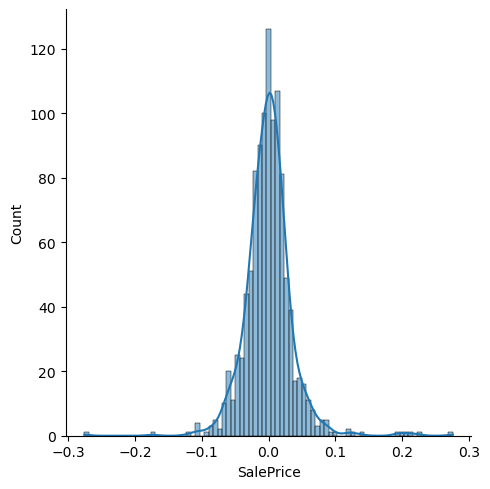

In [34]:
y_train_pred=lr.predict(x_train_rfe)

res=y_train-y_train_pred
sns.displot(res,kde=True)
plt.show()
# plt.savefig("res.jpg")

#### Key Takeaways:
From the above distplot we can observe that the residuals are not normaly distributed.

In [35]:
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
rss=np.sum(np.square(y_train, y_train_pred))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0012998456018690784
R-squared:  0.8930829893793096
RSS:  61.016963796021706


In [36]:
y_test=df_test.pop('SalePrice')
x_test=df_test[col]
print('x_test shape: ',x_test.shape)
print('y_test shape: ',y_test.shape)

x_test shape:  (268, 50)
y_test shape:  (268,)


### R square

In [37]:
y_test_pred=lr.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.42408860525681125
RSS test:  14.310805054792365


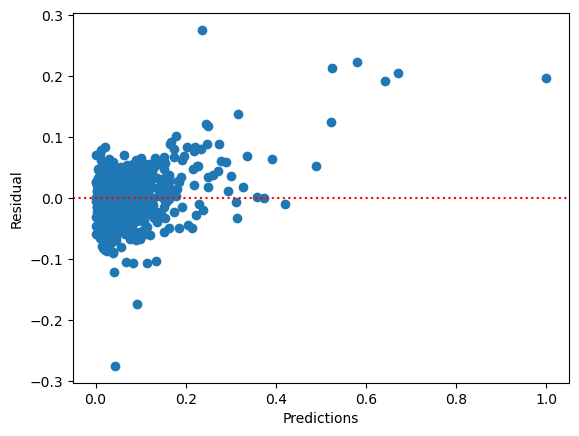

In [38]:
plt.scatter(y_train_pred, res) 
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
plt.show()

#### Key Takeaways:
From the above scaterplot we can observe that the spread of residuals.

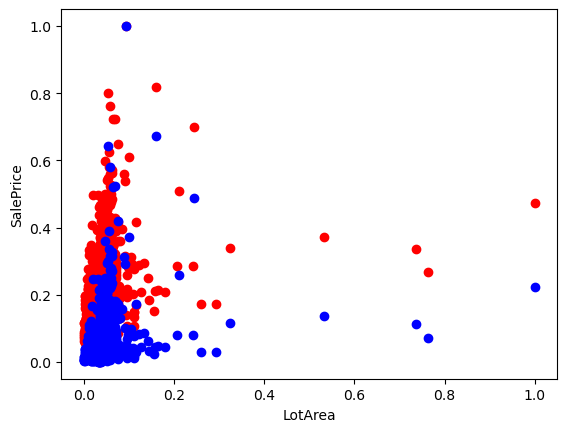

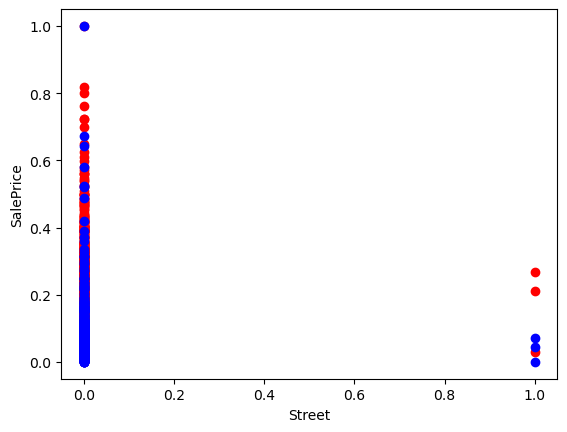

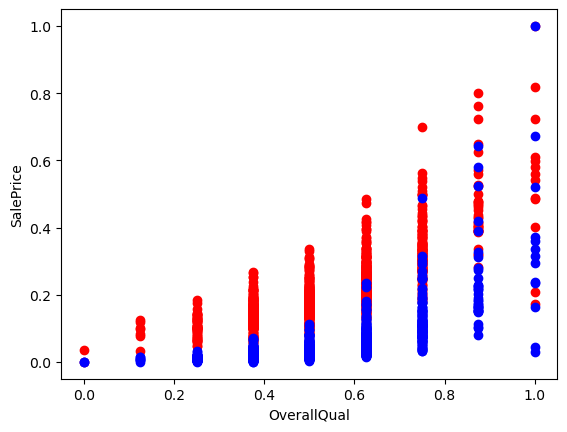

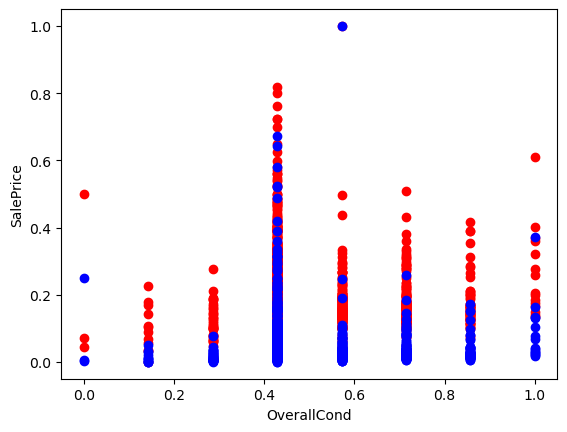

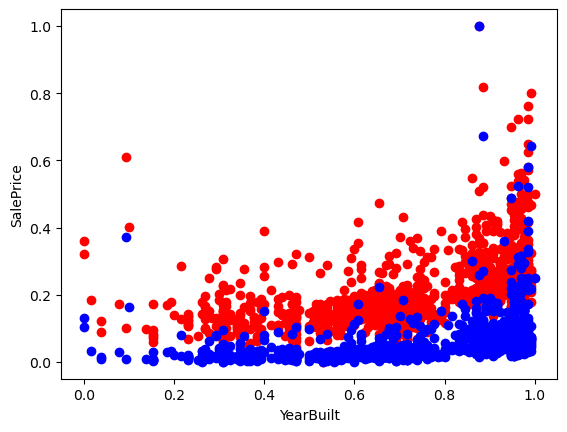

...

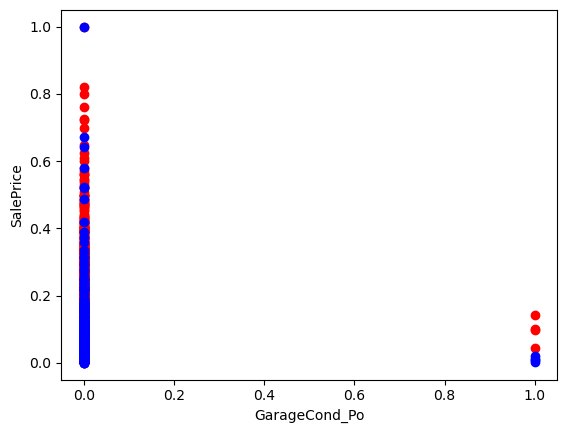

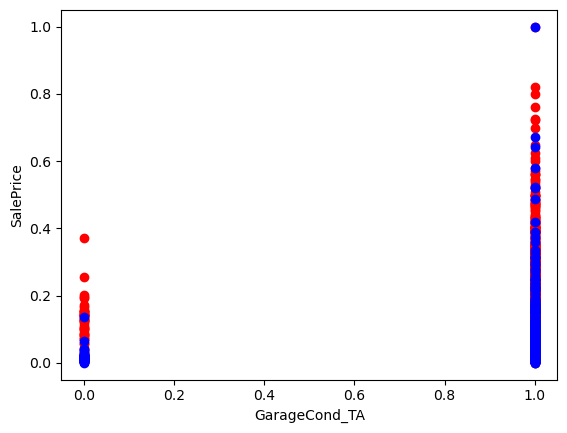

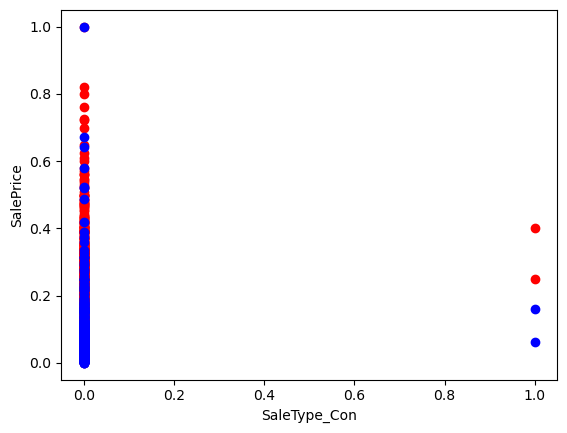

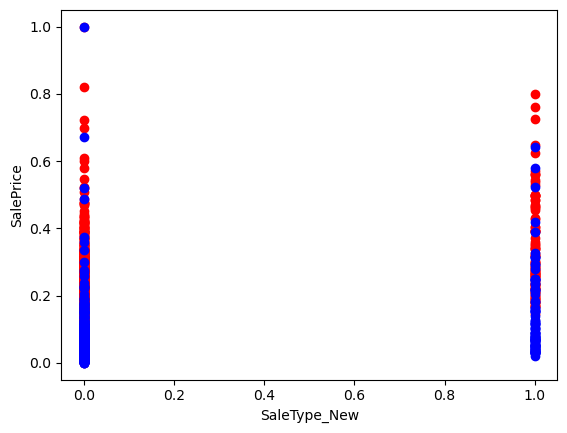

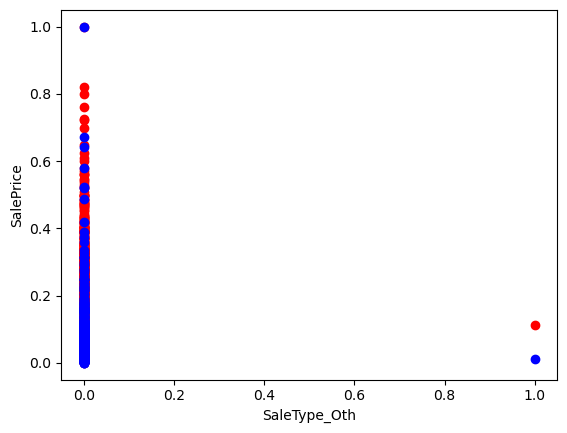

In [39]:
for col in x_train_rfe.columns:
    plt.scatter(x_train_rfe[col], y_train, color = 'red') 
    plt.scatter(x_train_rfe[col], y_train_pred, color = 'blue') 
    plt.xlabel(col) 
    plt.ylabel("SalePrice") 
    plt.show()

#### Key Takeaways:
From the above plot we can observe that the predictions and original values for different columns.

## Ridge

In [40]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}
ridge = Ridge()
#cross validation
folds = 5
model_cv = GridSearchCV(
    estimator = ridge,
    param_grid = params,
    scoring= 'neg_mean_absolute_error', 
    cv = folds,
    return_train_score=True, verbose = 1)
model_cv.fit(x_train_rfe, y_train)

# Get the best alpha value from the grid search
best_alpha = model_cv.best_params_['alpha']
print('best_alpha: ',best_alpha)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
best_alpha:  0.05


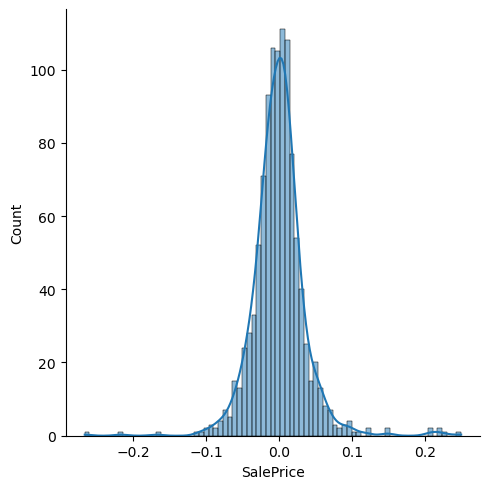

In [41]:
best_ridge_model = Ridge(alpha=best_alpha)
best_ridge_model.fit(x_train_rfe, y_train)
y_train_pred_red=best_ridge_model.predict(x_train_rfe)

res=y_train-y_train_pred_red
sns.displot(res,kde=True)
# plt.savefig("res2.jpg")
plt.show()

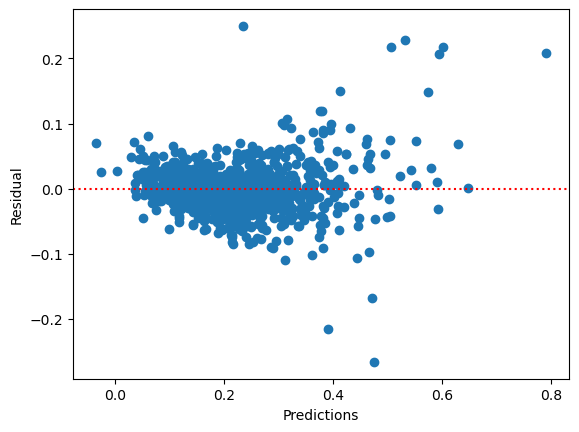

In [42]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred_red, res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt2.jpg")
plt.show()

In [43]:
mse = mean_squared_error(y_train, y_train_pred_red)
r2 = r2_score(y_train, y_train_pred_red)
rss=np.sum(np.square(y_train, y_train_pred_red))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0013734804250407438
R-squared:  0.887026258364659
RSS:  61.016963796021706


In [44]:
y_test_pred=best_ridge_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.6359072856871386
RSS test:  14.310805054792365


## Lasso

In [45]:
lasso = Lasso()
#cross validation
folds = 5
model_cv = GridSearchCV(
    estimator = lasso,
    param_grid = params,
    scoring= 'neg_mean_absolute_error', 
    cv = folds,
    return_train_score=True, verbose = 1)
model_cv.fit(x_train_rfe, y_train)

# Get the best alpha value from the grid search
best_alpha = model_cv.best_params_['alpha']
print('best_alpha: ',best_alpha)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
best_alpha:  0.0001


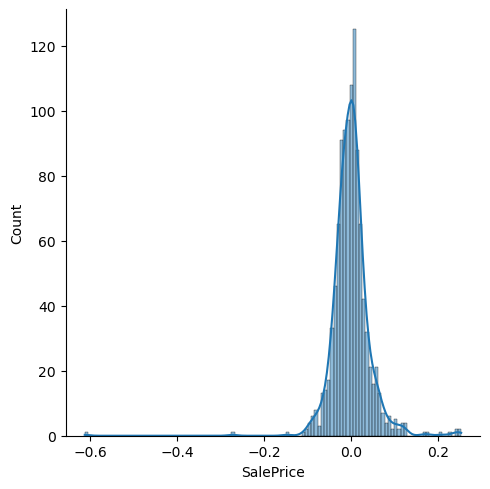

In [46]:
best_lasso_model = Lasso(alpha=best_alpha)
best_lasso_model.fit(x_train_rfe, y_train)
y_train_pred_laso=best_lasso_model.predict(x_train_rfe)

res=y_train-y_train_pred_laso
sns.displot(res,kde=True)
# plt.savefig("res3.jpg")
plt.show()

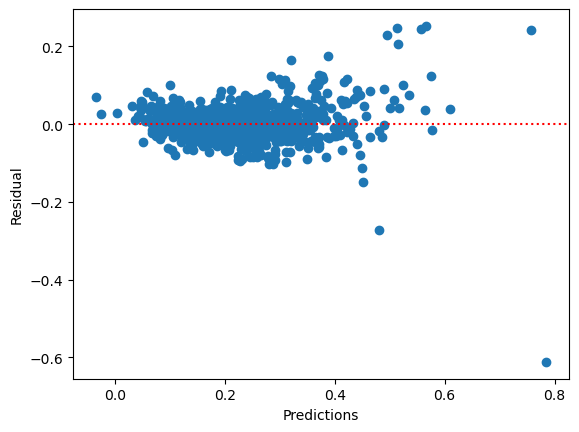

In [47]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred_laso, res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt3.jpg")
plt.show()

In [48]:
mse = mean_squared_error(y_train, y_train_pred_laso)
r2 = r2_score(y_train, y_train_pred_laso)
rss=np.sum(np.square(y_train, y_train_pred_laso))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0019761117188903258
R-squared:  0.8374576508683313
RSS:  61.016963796021706


In [49]:
y_test_pred=best_lasso_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.8003806042188712
RSS test:  14.310805054792365


### Model Training:
#### Exprement 2

In [50]:
lm=LinearRegression()
lm.fit(x_train,y_train)
rfe=RFE(estimator=lm, n_features_to_select=100)

rfe=rfe.fit(x_train,y_train)
rfe_rank=list(zip(x_train.columns,rfe.support_,rfe.ranking_))
for i in rfe_rank:
    print(i)

('Id', False, 68)
('MSSubClass', True, 1)
('LotArea', True, 1)
('Street', True, 1)
('Utilities', True, 1)
('OverallQual', True, 1)
('OverallCond', True, 1)
('YearBuilt', True, 1)
('YearRemodAdd', False, 3)
('MasVnrArea', True, 1)
('BsmtFinSF1', True, 1)
('BsmtFinSF2', True, 1)
('BsmtUnfSF', True, 1)
('TotalBsmtSF', True, 1)
('CentralAir', False, 73)
('1stFlrSF', True, 1)
('2ndFlrSF', True, 1)
('LowQualFinSF', True, 1)
('GrLivArea', True, 1)
('BsmtFullBath', False, 102)
('BsmtHalfBath', False, 84)
('FullBath', False, 46)
('HalfBath', False, 66)
('BedroomAbvGr', True, 1)
('KitchenAbvGr', True, 1)
('TotRmsAbvGrd', True, 1)
('Fireplaces', False, 45)
('GarageYrBlt', False, 106)
('GarageCars', False, 22)
('GarageArea', True, 1)
('WoodDeckSF', False, 36)
('OpenPorchSF', True, 1)
('EnclosedPorch', False, 56)
('3SsnPorch', True, 1)
('ScreenPorch', True, 1)
('PoolArea', False, 58)
('MiscVal', False, 93)
('MoSold', False, 44)
('YrSold', False, 109)
('MSZoning_FV', True, 1)
('MSZoning_RH', True, 1

In [51]:
col=x_train.columns[rfe.support_]

x_train_rfe=x_train[col]

lr=LinearRegression()
lr.fit(x_train_rfe,y_train)

LinearRegression()

In [52]:
print(lr.intercept_)
print(lr.coef_)

8166106262.410382
[-1.20692983e-02  2.30295032e-01 -9.85656558e-02 -7.04906380e-02
  8.13572686e-02  5.75199901e-02  8.46642759e-02  2.91356792e-02
 -2.42576336e+11 -6.33517928e+10 -1.00400128e+11  2.54438679e+11
  3.06336526e+11  1.34805354e+11  4.11905249e+10 -3.74747363e+11
 -6.96659088e-02 -8.38317871e-02  4.25281525e-02  4.83016968e-02
 -1.15165710e-02  1.57175064e-02  2.99949646e-02  2.95639038e-02
  3.80554199e-02  3.66649628e-02  3.25622559e-02 -3.42674255e-02
  1.20830536e-02  1.43827200e-02 -4.66470718e-02  2.45604515e-02
  1.82466507e-02 -2.44216919e-02 -8.55827332e-03 -1.55029297e-02
 -1.70745850e-02  1.45683289e-02 -1.76773071e-02  4.52280045e-02
  3.47976685e-02  2.90756226e-02  5.92093468e-02  1.52969360e-02
  2.18257904e-02  1.78713799e-02 -3.50170135e-02  5.00349998e-02
 -3.44774246e-01 -1.38756752e-01 -2.89001465e-02 -1.77536011e-02
 -3.03831100e-02  2.12299824e-02  1.02432251e-01  9.19738770e-01
  9.43705592e+09  9.78806496e-01  9.39330101e-01  8.88624191e-01
  9.029

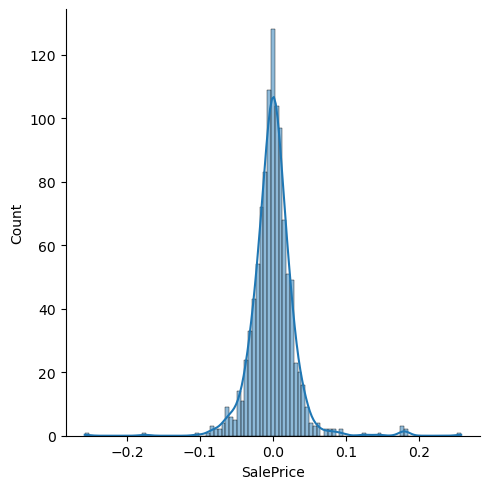

In [53]:
y_train_pred=lr.predict(x_train_rfe)

res=y_train-y_train_pred
sns.displot(res,kde=True)
# plt.savefig("res_100f.jpg")
plt.show()

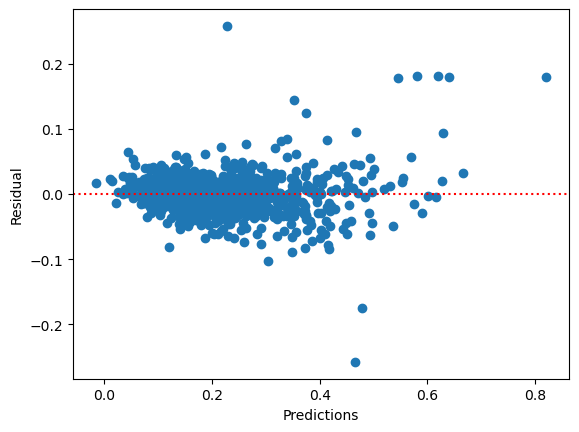

In [54]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred, res) 
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt_100f.jpg")
plt.show()

In [55]:
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
rss=np.sum(np.square(y_train, y_train_pred))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0009119493474222119
R-squared:  0.9249888618127641
RSS:  61.016963796021706


In [56]:
x_test=df_test[col]
print('x_test shape: ',x_test.shape)
print('y_test shape: ',y_test.shape)

x_test shape:  (268, 100)
y_test shape:  (268,)


In [57]:
y_test_pred=lr.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  -2.9266660439566557e+19
RSS test:  14.310805054792365


In [58]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}
ridge = Ridge()
#cross validation
folds = 5
model_cv = GridSearchCV(
    estimator = ridge,
    param_grid = params,
    scoring= 'neg_mean_absolute_error', 
    cv = folds,
    return_train_score=True, verbose = 1)
model_cv.fit(x_train_rfe, y_train)

# Get the best alpha value from the grid search
best_alpha = model_cv.best_params_['alpha']
print('best_alpha: ',best_alpha)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
best_alpha:  0.05


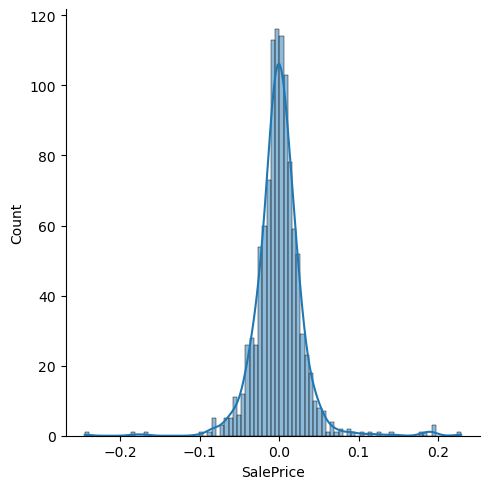

In [59]:
best_ridge_model = Ridge(alpha=best_alpha)
best_ridge_model.fit(x_train_rfe, y_train)
y_train_pred_red=best_ridge_model.predict(x_train_rfe)

res=y_train-y_train_pred_red
sns.displot(res,kde=True)
# plt.savefig("res2_100f.jpg")
plt.show()

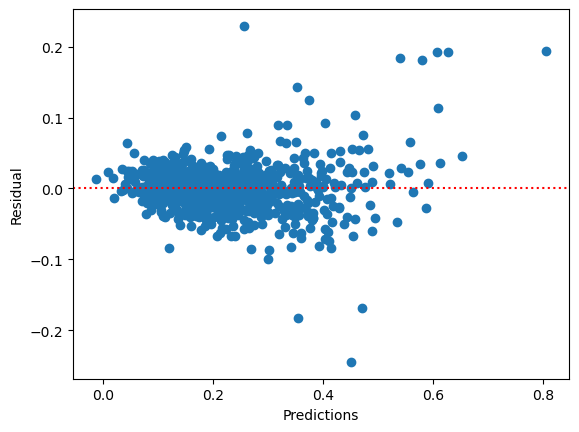

In [60]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred_red, res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt2_100f.jpg")
plt.show()

In [61]:
mse = mean_squared_error(y_train, y_train_pred_red)
r2 = r2_score(y_train, y_train_pred_red)
rss=np.sum(np.square(y_train, y_train_pred_red))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0009713208583133465
R-squared:  0.9201053399149431
RSS:  61.016963796021706


In [62]:
y_test_pred=best_ridge_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.6987653725950584
RSS test:  14.310805054792365


In [63]:
lasso = Lasso()
#cross validation
folds = 5
model_cv = GridSearchCV(
    estimator = lasso,
    param_grid = params,
    scoring= 'neg_mean_absolute_error', 
    cv = folds,
    return_train_score=True, verbose = 1)
model_cv.fit(x_train_rfe, y_train)

# Get the best alpha value from the grid search
best_alpha = model_cv.best_params_['alpha']
print("best_alpha: ",best_alpha)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
best_alpha:  0.0001


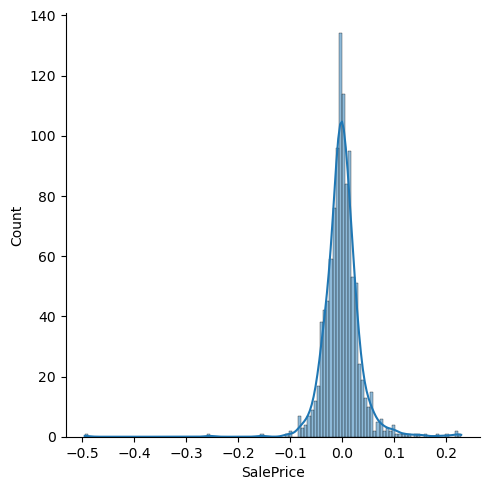

In [64]:
best_lasso_model = Lasso(alpha=best_alpha)
best_lasso_model.fit(x_train_rfe, y_train)
y_train_pred_laso=best_lasso_model.predict(x_train_rfe)

res=y_train-y_train_pred_laso
sns.displot(res,kde=True)
# plt.savefig("res3_100f.jpg")
plt.show()

#### Key Takeaways:
From the above distplot we can observe that the residuals are not normaly distributed.

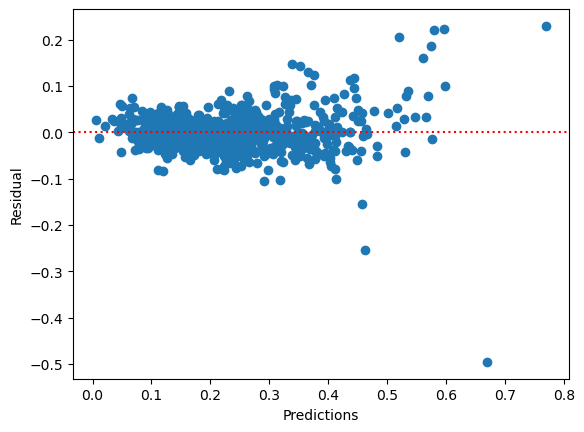

In [65]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred_laso, res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt3_100f.jpg")
plt.show()

In [66]:
mse = mean_squared_error(y_train, y_train_pred_laso)
r2 = r2_score(y_train, y_train_pred_laso)
rss=np.sum(np.square(y_train, y_train_pred_laso))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0014421803437209507
R-squared:  0.8813754411255882
RSS:  61.016963796021706


In [67]:
y_test_pred=best_lasso_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.8294051095483
RSS test:  14.310805054792365


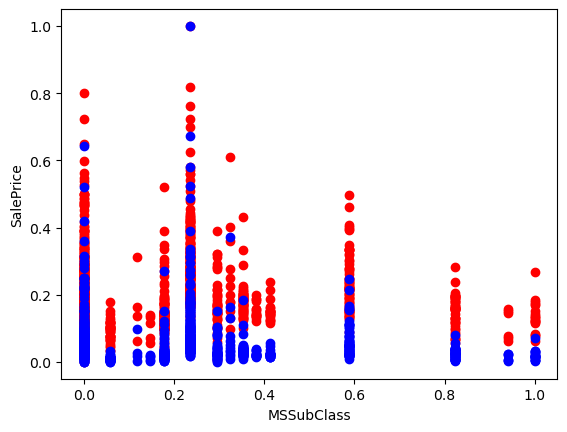

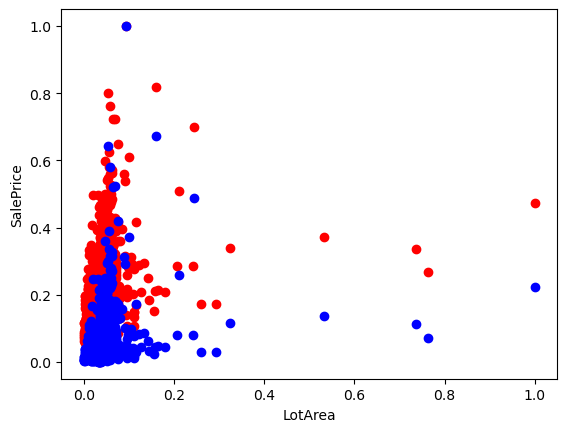

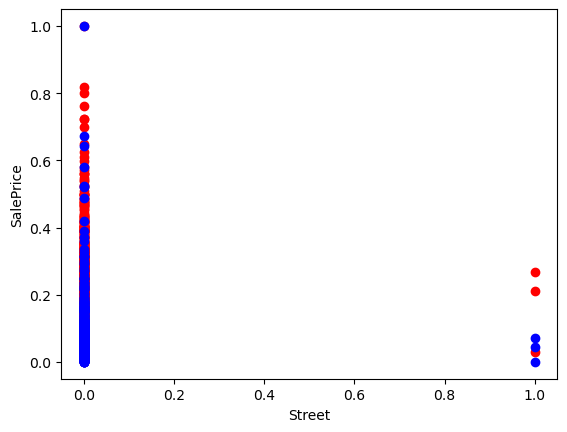

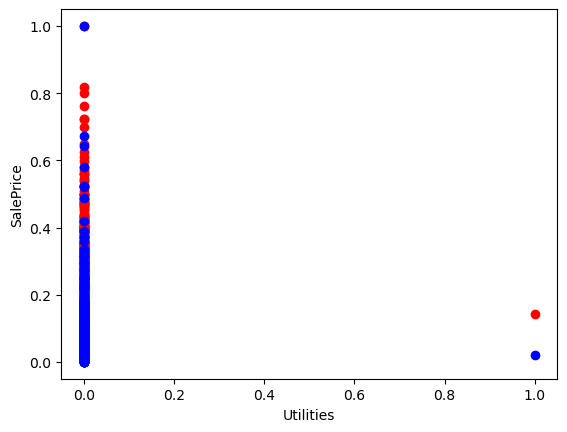

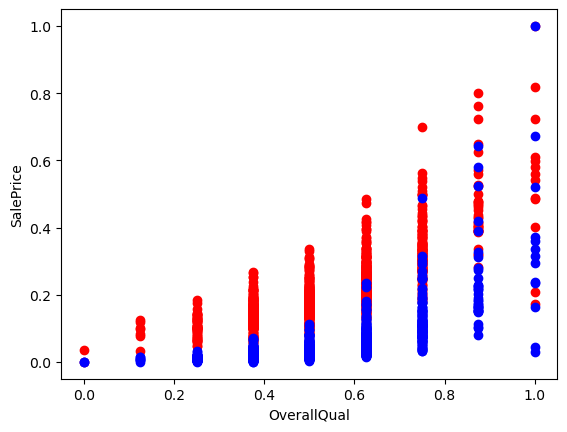

...

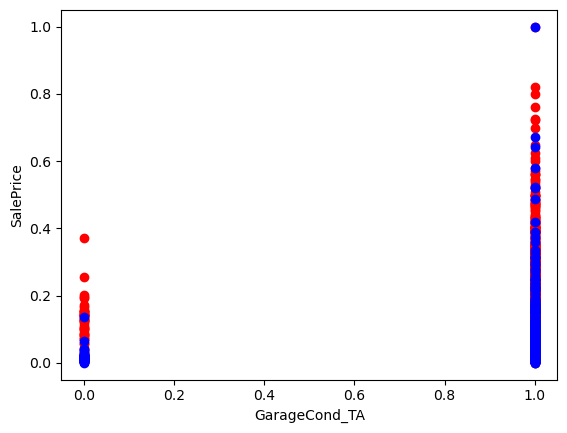

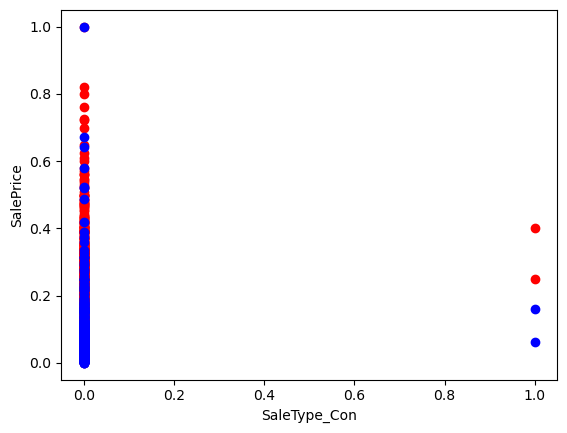

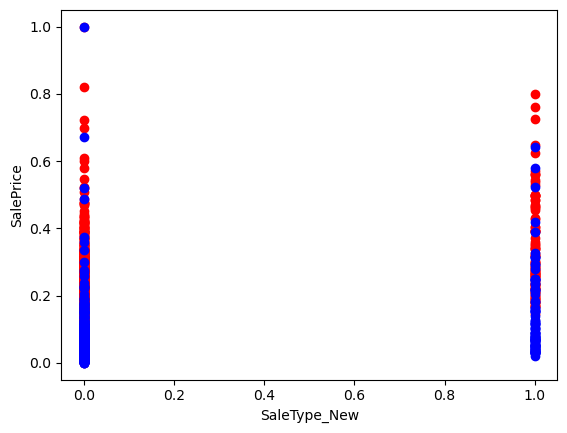

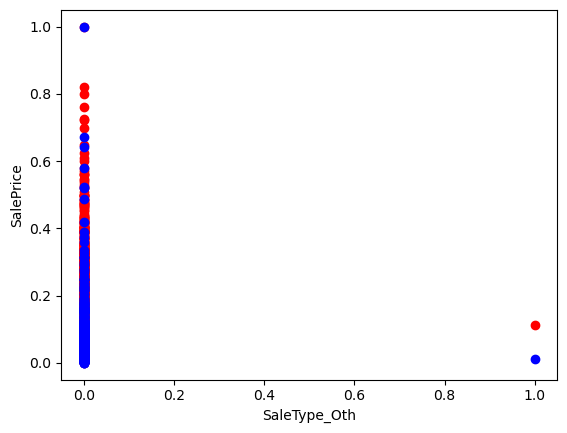

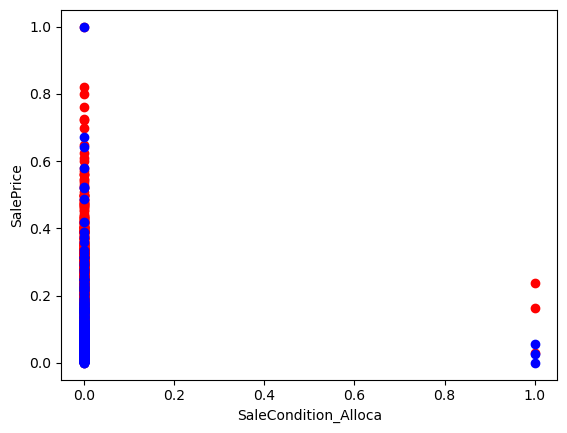

In [68]:
for col in x_train_rfe.columns:
    plt.scatter(x_train_rfe[col], y_train, color = 'red') 
    plt.scatter(x_train_rfe[col], y_train_pred_laso, color = 'blue') 
    plt.xlabel(col) 
    plt.ylabel("SalePrice") 
    plt.show()

### Model Training:
#### Exprement 3

In [69]:
lm=LinearRegression()
lm.fit(x_train,y_train)
rfe=RFE(estimator=lm, n_features_to_select=150)

rfe=rfe.fit(x_train,y_train)
rfe_rank=list(zip(x_train.columns,rfe.support_,rfe.ranking_))
for i in rfe_rank:
    print(i)

('Id', False, 18)
('MSSubClass', True, 1)
('LotArea', True, 1)
('Street', True, 1)
('Utilities', True, 1)
('OverallQual', True, 1)
('OverallCond', True, 1)
('YearBuilt', True, 1)
('YearRemodAdd', True, 1)
('MasVnrArea', True, 1)
('BsmtFinSF1', True, 1)
('BsmtFinSF2', True, 1)
('BsmtUnfSF', True, 1)
('TotalBsmtSF', True, 1)
('CentralAir', False, 23)
('1stFlrSF', True, 1)
('2ndFlrSF', True, 1)
('LowQualFinSF', True, 1)
('GrLivArea', True, 1)
('BsmtFullBath', False, 52)
('BsmtHalfBath', False, 34)
('FullBath', True, 1)
('HalfBath', False, 16)
('BedroomAbvGr', True, 1)
('KitchenAbvGr', True, 1)
('TotRmsAbvGrd', True, 1)
('Fireplaces', True, 1)
('GarageYrBlt', False, 56)
('GarageCars', True, 1)
('GarageArea', True, 1)
('WoodDeckSF', True, 1)
('OpenPorchSF', True, 1)
('EnclosedPorch', False, 6)
('3SsnPorch', True, 1)
('ScreenPorch', True, 1)
('PoolArea', False, 8)
('MiscVal', False, 43)
('MoSold', True, 1)
('YrSold', False, 59)
('MSZoning_FV', True, 1)
('MSZoning_RH', True, 1)
('MSZoning_RL'

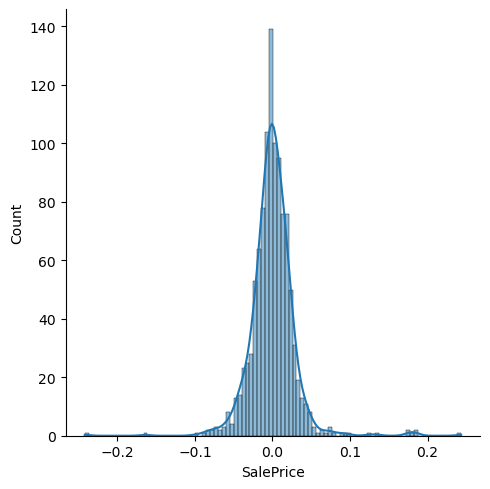

In [70]:
col=x_train.columns[rfe.support_]

x_train_rfe=x_train[col]



lr=LinearRegression()
lr.fit(x_train_rfe,y_train)

y_train_pred=lr.predict(x_train_rfe)

res=y_train-y_train_pred
sns.displot(res,kde=True)
# plt.savefig("res_150f.jpg")
plt.show()

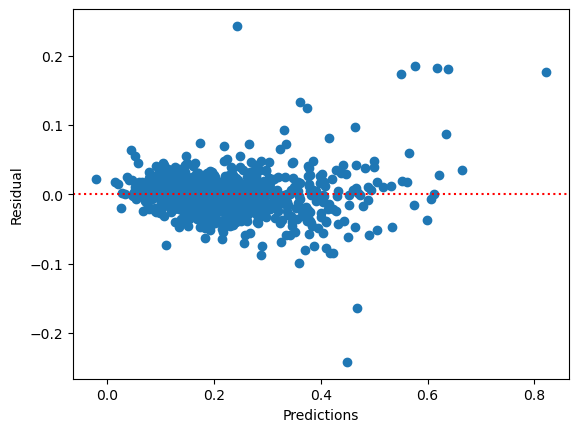

In [71]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred, res) 
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt_150f.jpg")
plt.show()

In [72]:
mse = mean_squared_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)
rss=np.sum(np.square(y_train, y_train_pred))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0008463219102728381
R-squared:  0.9303869563130792
RSS:  61.016963796021706


In [73]:
x_test=df_test[col]
print('x_test shape: ',x_test.shape)
print('y_test shape: ',y_test.shape)

x_test shape:  (268, 150)
y_test shape:  (268,)


In [74]:
y_test_pred=lr.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  -3247290373922286.0
RSS test:  14.310805054792365


## Ridge

In [75]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}
ridge = Ridge()
#cross validation
folds = 5
model_cv = GridSearchCV(
    estimator = ridge,
    param_grid = params,
    scoring= 'neg_mean_absolute_error', 
    cv = folds,
    return_train_score=True, verbose = 1)
model_cv.fit(x_train_rfe, y_train)

# Get the best alpha value from the grid search
best_alpha = model_cv.best_params_['alpha']
print("best_alpha: ",best_alpha)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
best_alpha:  0.05


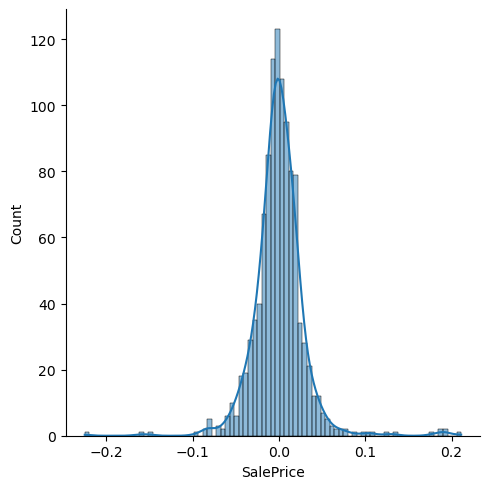

In [76]:
best_ridge_model = Ridge(alpha=best_alpha)
best_ridge_model.fit(x_train_rfe, y_train)
y_train_pred_red=best_ridge_model.predict(x_train_rfe)

res=y_train-y_train_pred_red
sns.displot(res,kde=True)
# plt.savefig("res2_150f.jpg")
plt.show()

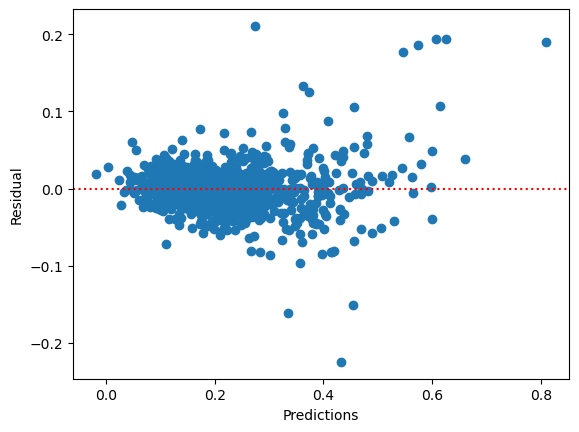

In [77]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred_red, res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt2_150f.jpg")
plt.show()

In [78]:
mse = mean_squared_error(y_train, y_train_pred_red)
r2 = r2_score(y_train, y_train_pred_red)
rss=np.sum(np.square(y_train, y_train_pred_red))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0009023792863178755
R-squared:  0.9257760340148024
RSS:  61.016963796021706


In [79]:
y_test_pred=best_ridge_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.732059793757553
RSS test:  14.310805054792365


## Lasso

In [80]:
lasso = Lasso()
#cross validation
folds = 5
model_cv = GridSearchCV(
    estimator = lasso,
    param_grid = params,
    scoring= 'neg_mean_absolute_error', 
    cv = folds,
    return_train_score=True, verbose = 1)
model_cv.fit(x_train_rfe, y_train)

# Get the best alpha value from the grid search
best_alpha = model_cv.best_params_['alpha']
print('best_alpha: ',best_alpha)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
best_alpha:  0.0001


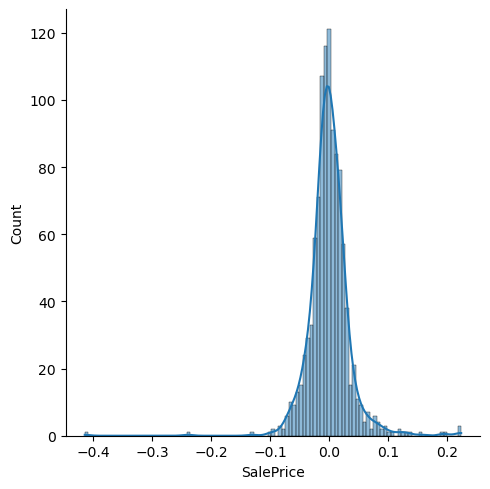

In [81]:
best_lasso_model = Lasso(alpha=best_alpha)
best_lasso_model.fit(x_train_rfe, y_train)
y_train_pred_laso=best_lasso_model.predict(x_train_rfe)

res=y_train-y_train_pred_laso
sns.displot(res,kde=True)
# plt.savefig("res3_150f.jpg")
plt.show()

#### Key Takeaways:
From the above distplot we can observe that the residuals are not normaly distributed.

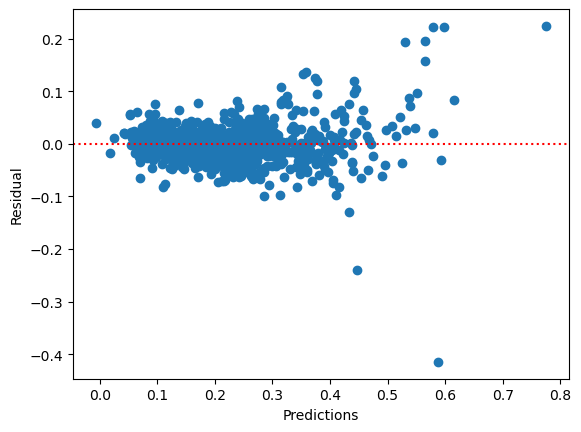

In [82]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred_laso, res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt3_150f.jpg")
plt.show()

In [83]:
mse = mean_squared_error(y_train, y_train_pred_laso)
r2 = r2_score(y_train, y_train_pred_laso)
rss=np.sum(np.square(y_train, y_train_pred_laso))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0013047343263716334
R-squared:  0.8926808740751461
RSS:  61.016963796021706


In [84]:
y_test_pred=best_lasso_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.837053204502147
RSS test:  14.310805054792365


#### Train predictions vs original

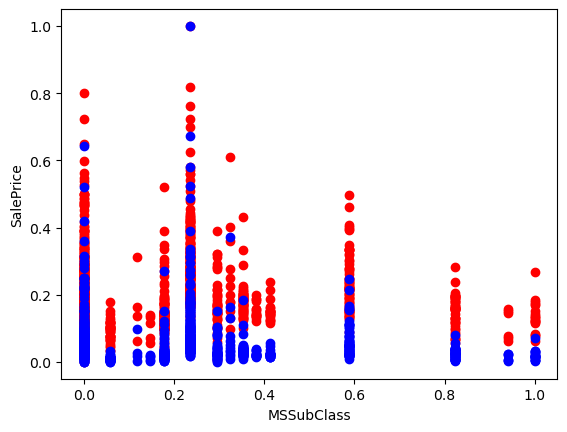

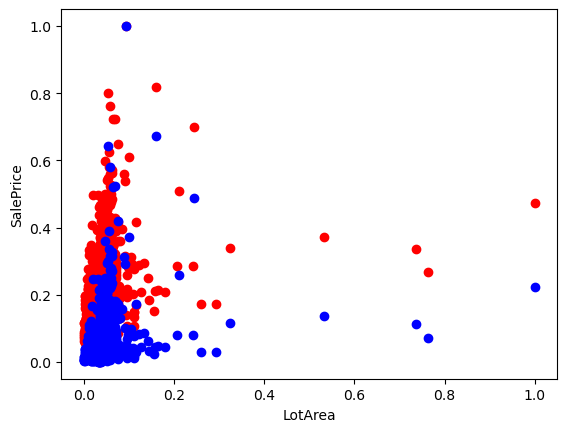

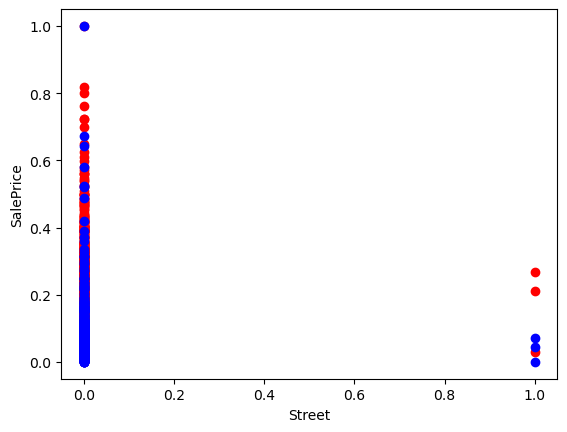

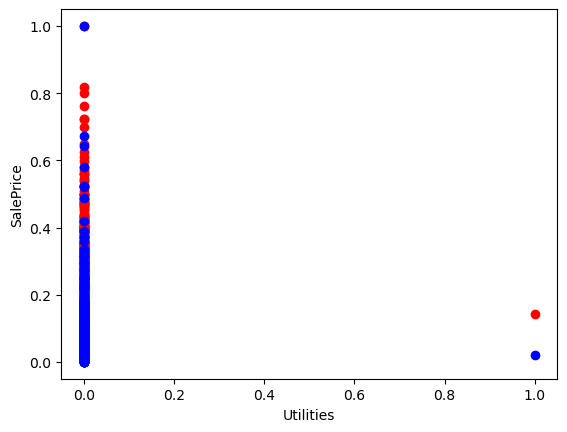

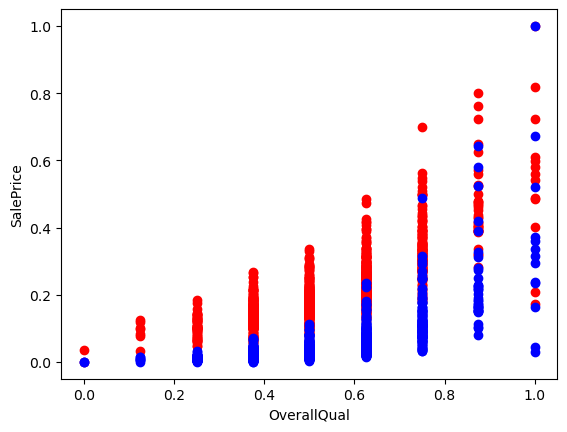

...

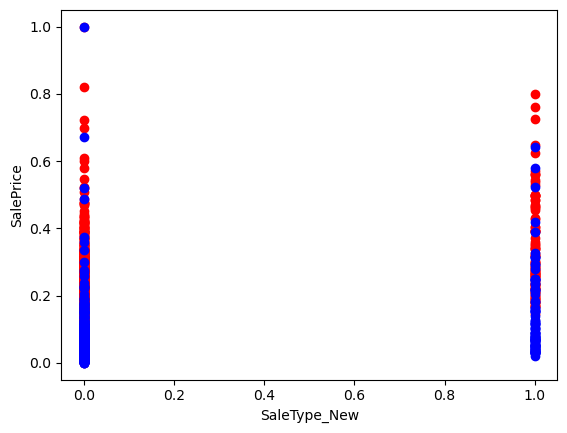

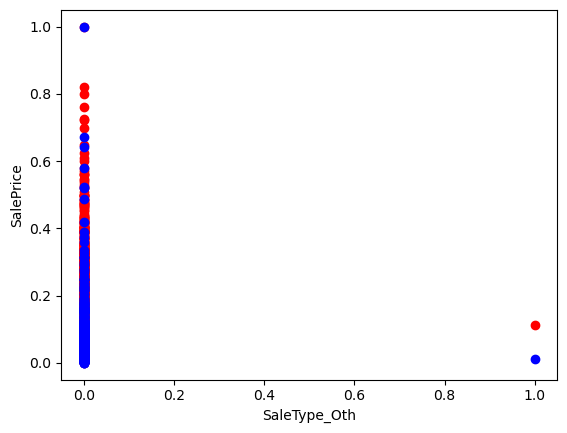

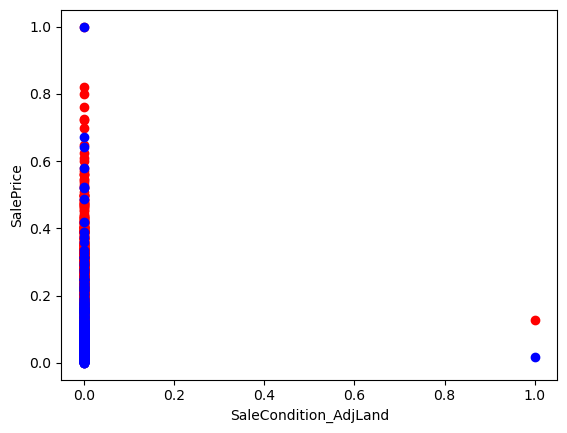

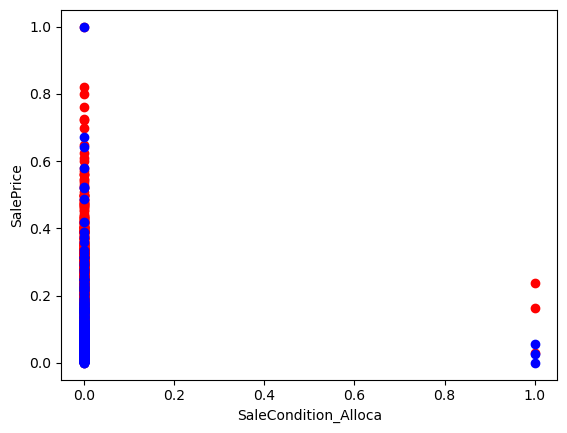

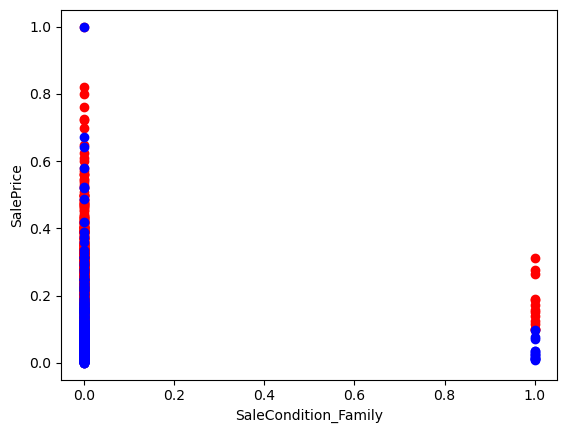

In [85]:
for col in x_train_rfe.columns:
    plt.scatter(x_train_rfe[col], y_train, color = 'red') 
    plt.scatter(x_train_rfe[col], y_train_pred_laso, color = 'blue') 
    plt.xlabel(col) 
    plt.ylabel("SalePrice") 
    plt.show()

#### Test predictions vs original

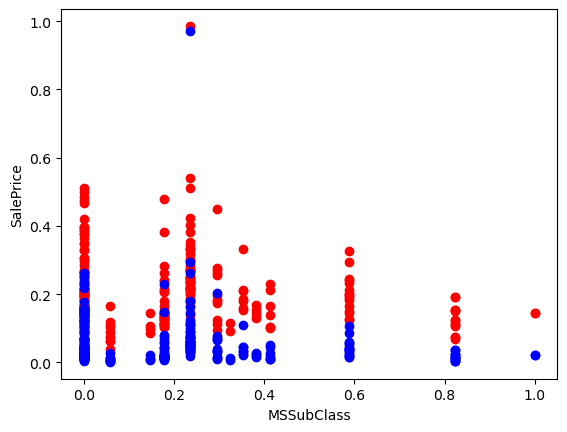

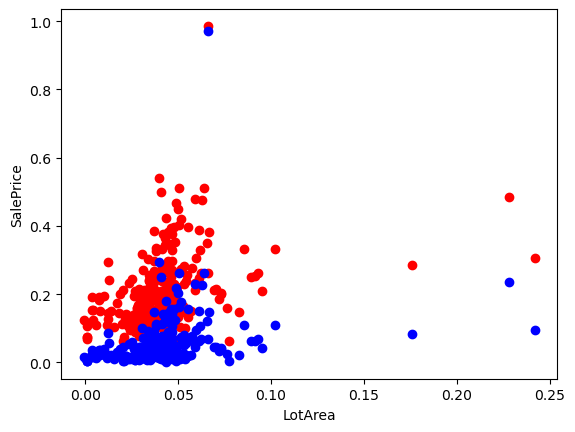

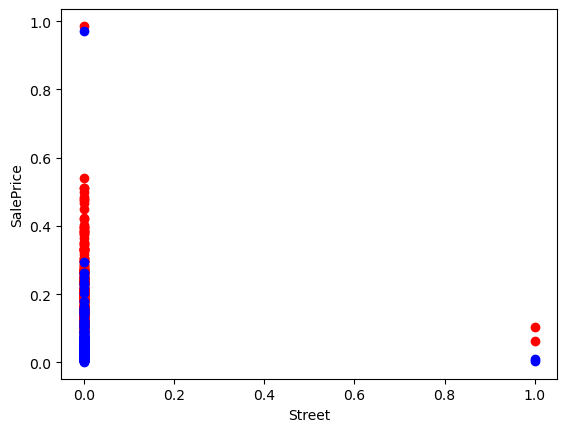

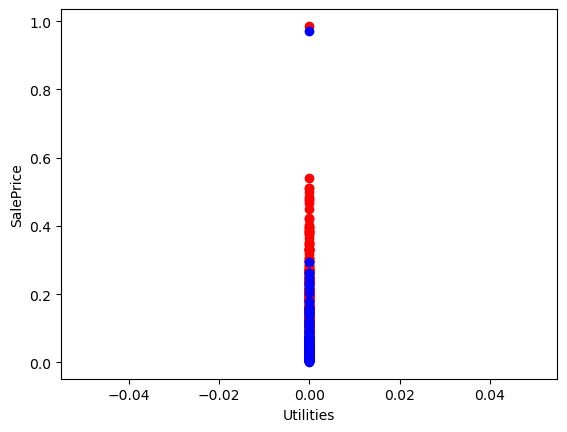

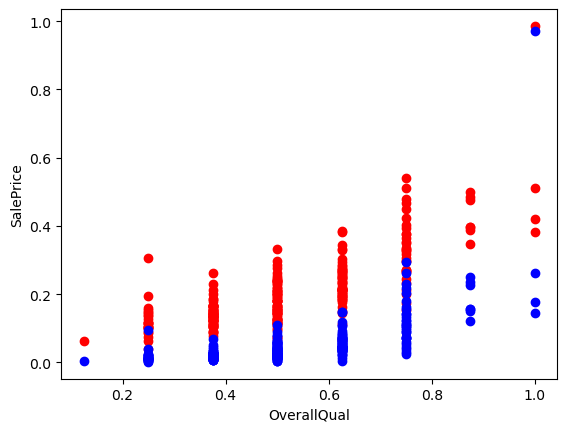

...

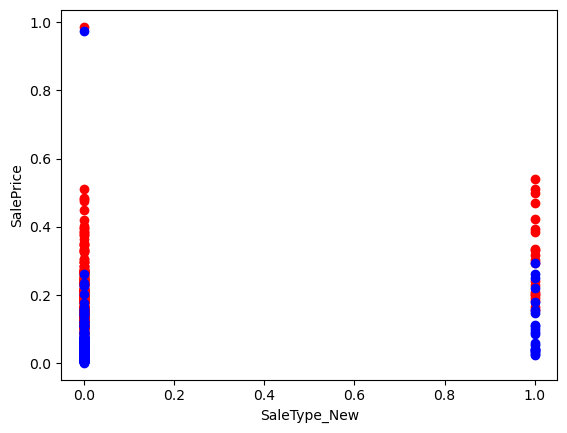

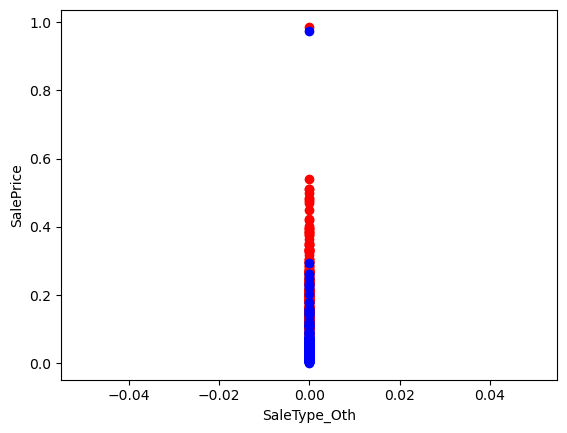

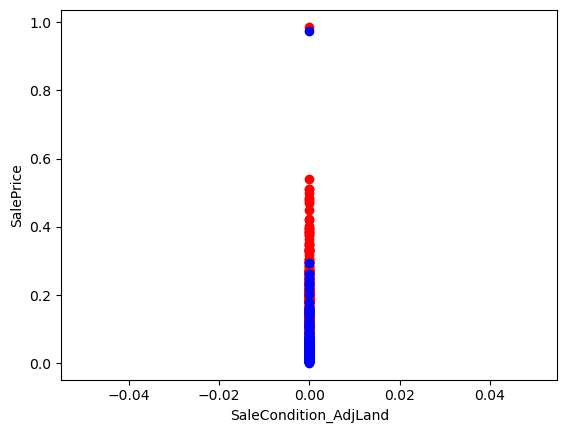

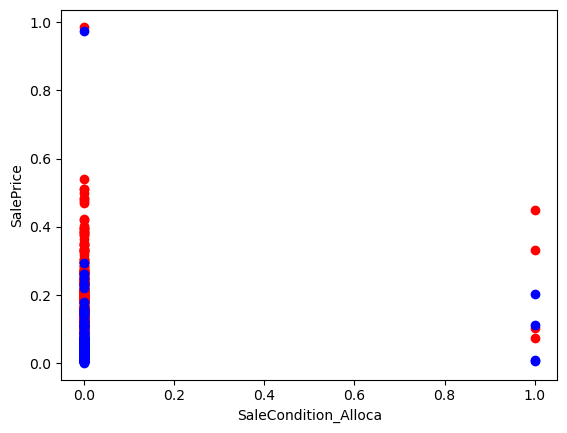

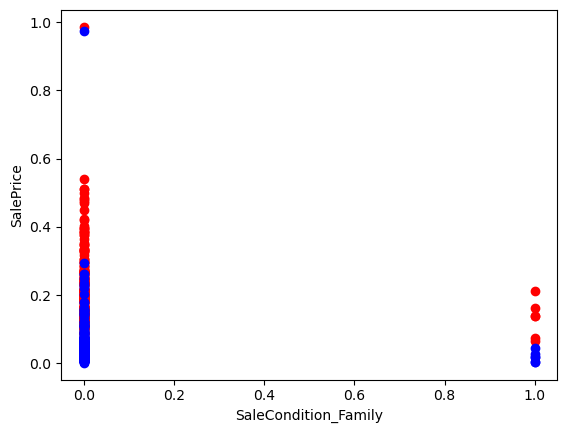

In [86]:
for col in x_test.columns:
    plt.scatter(x_test[col], y_test, color = 'red') 
    plt.scatter(x_test[col], y_test_pred, color = 'blue') 
    plt.xlabel(col) 
    plt.ylabel("SalePrice") 
    plt.show()

### Doubling the alpha of ridge 

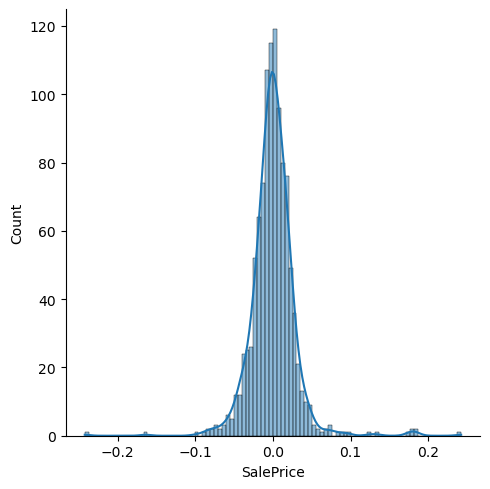

In [87]:
best_ridge_model = Ridge(alpha=best_alpha*2)
best_ridge_model.fit(x_train_rfe, y_train)
y_train_pred_red=best_ridge_model.predict(x_train_rfe)

res=y_train-y_train_pred_red
sns.displot(res,kde=True)
# plt.savefig("res2_150f.jpg")
plt.show()

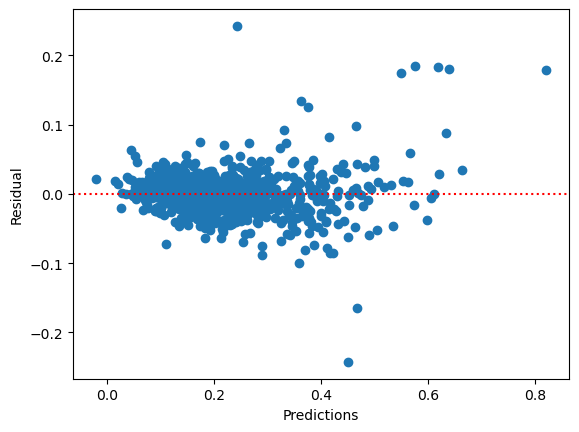

In [88]:
# df['res']=res
plt.figure()
plt.scatter(y_train_pred_red, res)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("Predictions") 
plt.ylabel("Residual")
# plt.savefig("res_plt2_150f.jpg")
plt.show()

In [89]:
mse = mean_squared_error(y_train, y_train_pred_red)
r2 = r2_score(y_train, y_train_pred_red)
rss=np.sum(np.square(y_train, y_train_pred_red))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0008462367362535769
R-squared:  0.9303939621847834
RSS:  61.016963796021706


In [90]:
y_test_pred=best_ridge_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.5516543452666106
RSS test:  14.310805054792365


### Doubling the alpha of lasso 

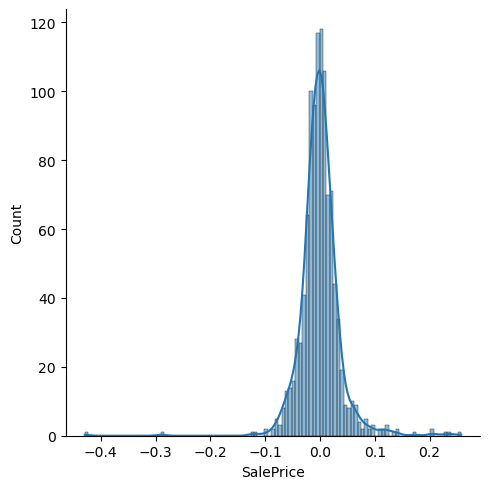

In [91]:
best_lasso_model = Lasso(alpha=best_alpha*2)
best_lasso_model.fit(x_train_rfe, y_train)
y_train_pred_laso=best_lasso_model.predict(x_train_rfe)

res=y_train-y_train_pred_laso
sns.displot(res,kde=True)
# plt.savefig("res3_150f.jpg")
plt.show()

In [93]:
mse = mean_squared_error(y_train, y_train_pred_laso)
r2 = r2_score(y_train, y_train_pred_laso)
rss=np.sum(np.square(y_train, y_train_pred_laso))
print('Mean Squared Error: ',mse)
print('R-squared: ',r2)
print('RSS: ',rss)

Mean Squared Error:  0.0014558198580294091
R-squared:  0.8802535416522341
RSS:  61.016963796021706


In [94]:
y_test_pred=best_lasso_model.predict(x_test)

r2_val = r2_score(y_test, y_test_pred)
print('R square value: ',r2_val)
rss_test=np.sum(np.square(y_test, y_test_pred))
print('RSS test: ',rss_test)

R square value:  0.8381385401041733
RSS test:  14.310805054792365


In [103]:
col=x_train_rfe.columns
coef = best_lasso_model.coef_
for i,j in zip(x_train_rfe.columns,best_lasso_model.coef_):
    print(i,j)

MSSubClass -0.04442996456040984
LotArea 0.01712758761145351
Street -0.0
Utilities -0.0
OverallQual 0.11771923119797977
OverallCond 0.030962818406640266
YearBuilt 0.0195666545554664
YearRemodAdd 0.016323628012575992
MasVnrArea 0.03444151882088177
BsmtFinSF1 0.027996715087226662
BsmtFinSF2 0.0
BsmtUnfSF -0.01681953057413588
TotalBsmtSF 0.0
1stFlrSF 0.019031659134071587
2ndFlrSF 0.0
LowQualFinSF -0.0
GrLivArea 0.22390372627030328
FullBath 0.015514951492105132
BedroomAbvGr -0.0
KitchenAbvGr -0.012052214380732116
TotRmsAbvGrd 0.053764520555640426
Fireplaces 0.025008857243567405
GarageCars 0.04753019651752876
GarageArea 0.0
WoodDeckSF 0.017271311873155573
OpenPorchSF 0.0
3SsnPorch 0.0
ScreenPorch 0.023299595290660495
MoSold -0.0034476579047127013
MSZoning_FV 0.0
MSZoning_RH -0.0
MSZoning_RL 0.011561688526678483
MSZoning_RM -0.0
LandContour_HLS 0.015968619265255522
LandContour_Low 0.0029765357956760123
LandContour_Lvl 0.011532809556489807
LotConfig_CulDSac 0.01614249922756742
LotConfig_FR2 -0

### Top columns

OverallQual 0.11771923119797977

GrLivArea 0.22390372627030328

RoofMatl_WdShngl 0.10699763348418885

TotRmsAbvGrd 0.053764520555640426

Neighborhood_NoRidge 0.0642193643493386

## Conclusion:

The taget column 'ScalePrrice' can be explaned by the columns ref 150 columns, with the Lasso Regression.

Which has a,

train R-squared:  0.8926808740751461 &


test R square value:  0.837053204502147.